# XMM-LSS master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))
import datetime
print("This notebook was executed on: \n{}".format(datetime.datetime.now()))

This notebook was run with herschelhelp_internal version: 
0246c5d (Thu Jan 25 17:01:47 2018 +0000) [with local modifications]


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3

from herschelhelp_internal.masterlist import (nb_compare_mags, nb_ccplots, nb_histograms, 
                                              quick_checks, find_last_ml_suffix)

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "20171016"

master_catalogue_filename = "master_catalogue_xmm-lss_{}.fits".format(SUFFIX)
master_catalogue = Table.read("{}/{}".format(OUT_DIR, master_catalogue_filename))

print("Diagnostics done using: {}".format(master_catalogue_filename))

Diagnostics done using: master_catalogue_xmm-lss_20180205.fits


## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(401, False) will return an array of dtype('bool')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(401, 0) will return an array of dtype('int64')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,f_acs_f606w,False,28751,0,631,-0.146337
1,f_ap_acs_f606w,False,28754,0,2020,-1.04212
2,f_acs_f814w,False,28750,0,363,-0.473682
3,f_ap_acs_f814w,False,28753,0,1381,-0.221474
4,f_wfc3_f125w,False,35714,0,355,-0.868321
5,f_ap_wfc3_f125w,False,35718,0,1304,-0.823528
6,f_wfc3_f160w,False,35752,0,1,-0.0136137
7,f_ap_wfc3_f160w,False,35931,0,683,-0.22035
8,f_suprime_b,False,35617,0,788,-51.9175224
9,f_suprime_v,False,35617,0,531,-46.0794868


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

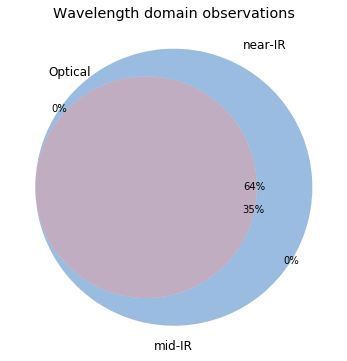

In [6]:
venn3(
    [
        np.sum(flag_obs == 4),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 6),
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 5),
        np.sum(flag_obs == 3),
        np.sum(flag_obs == 7)
    ],
    set_labels=('mid-IR', 'near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

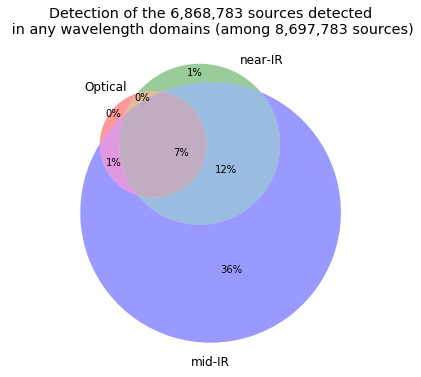

In [7]:
venn3(
    [
        np.sum(flag_det[flag_obs == 7] == 4),
        np.sum(flag_det[flag_obs == 7] == 2),
        np.sum(flag_det[flag_obs == 7] == 6),
        np.sum(flag_det[flag_obs == 7] == 1),
        np.sum(flag_det[flag_obs == 7] == 5),
        np.sum(flag_det[flag_obs == 7] == 3),
        np.sum(flag_det[flag_obs == 7] == 7)
    ],
    set_labels=('mid-IR', 'near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u"]
g_bands = ["Megacam g", "SUPRIME g", "GPC1 g", "DECam g"]
r_bands = ["Megacam r", "SUPRIME r", "GPC1 r", "DECam r"]
i_bands = ["Megacam i", "SUPRIME i", "GPC1 i", "DECam i" ]
z_bands = ["Megacam z", "SUPRIME z", "GPC1 z", "DECam z", "VISTA Z"]
y_bands = ["Megacam y", "SUPRIME y", "GPC1 y", "DECam y", "VISTA Y"]
j_bands = [                                               "VISTA J",  "UKIDSS J", "WIRCAM J"]
h_bands = [                                               "VISTA H",  "UKIDSS H", "WIRCAM H"]
k_bands = [                                               "VISTA Ks", "UKIDSS K", "WIRCAM Ks"]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

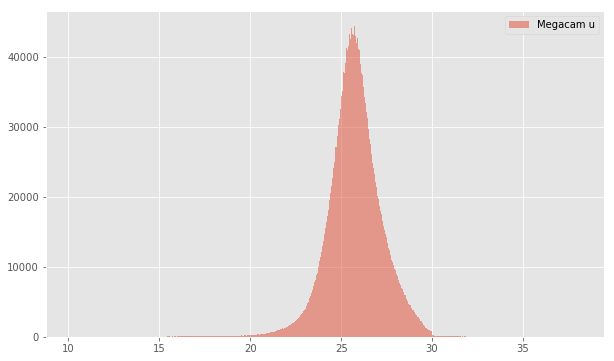

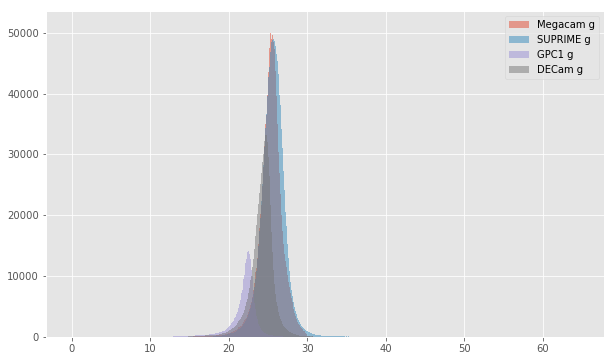

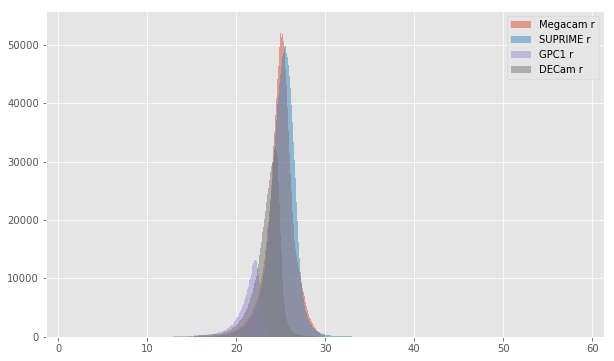

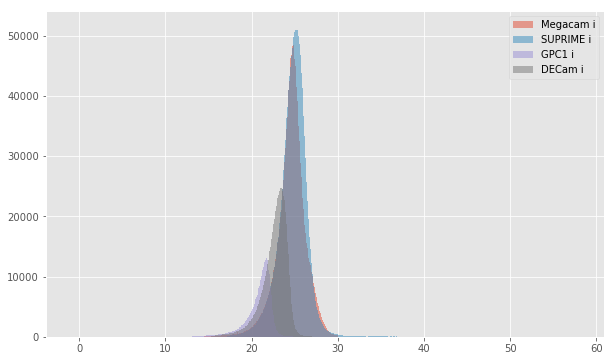

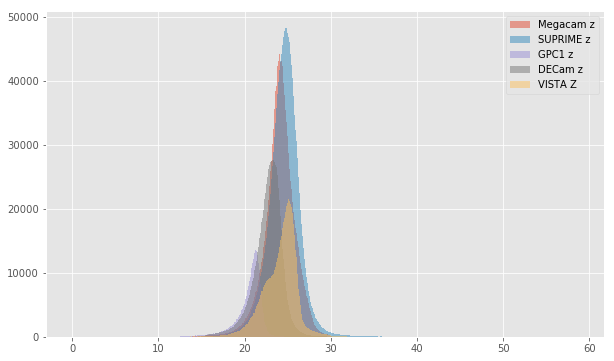

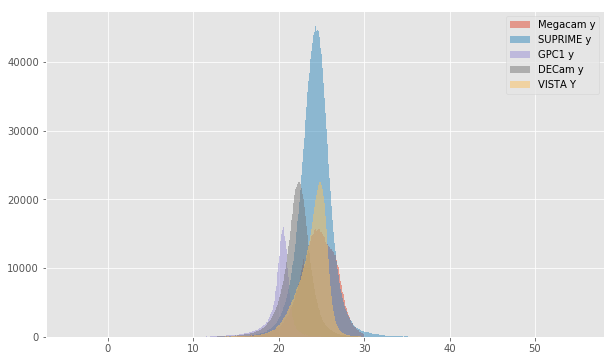

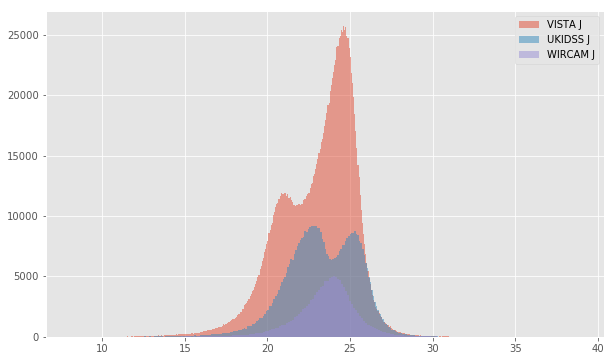

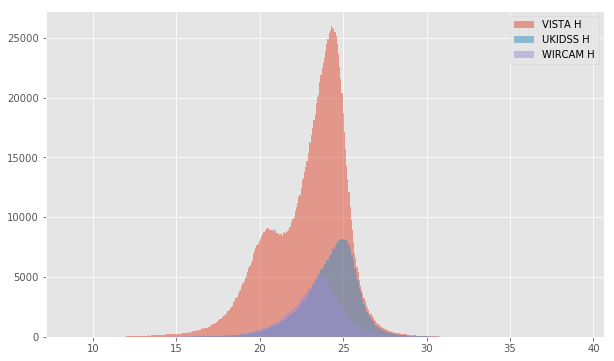

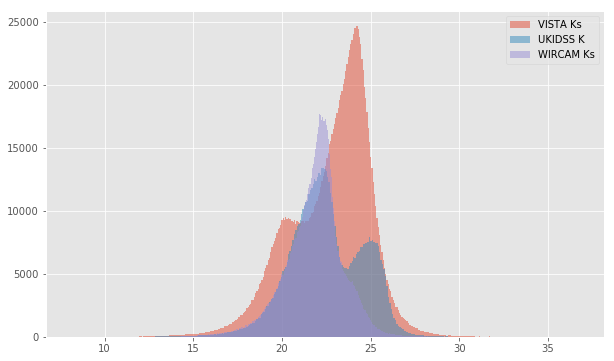

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4492081451416015
- 99% percentile: 2.0144900131225505


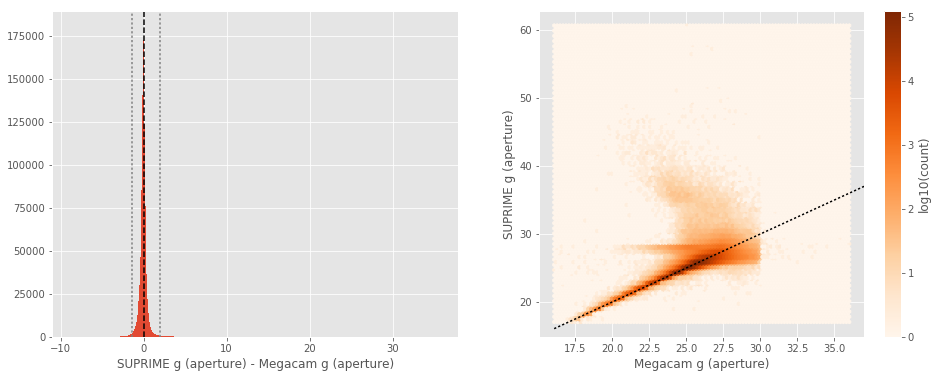

SUPRIME g (total) - Megacam g (total):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -2.2842457008361814
- 99% percentile: 2.336108417510987


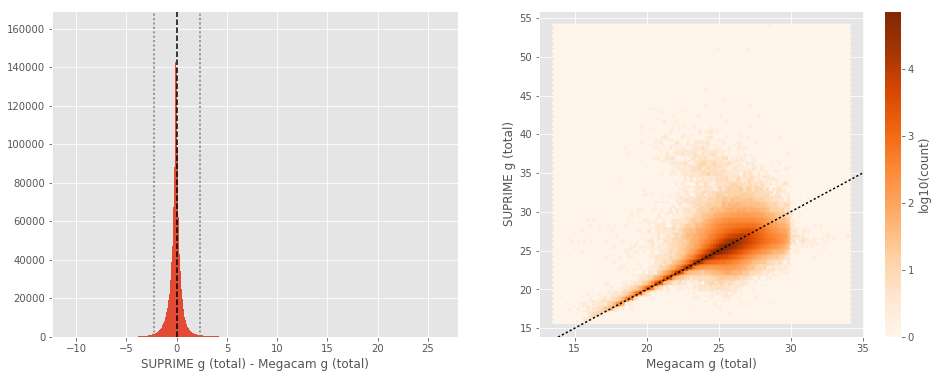

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.26
- Median Absolute Deviation: 0.32
- 1% percentile: -2.9233462905883787
- 99% percentile: 2.1538622093200677


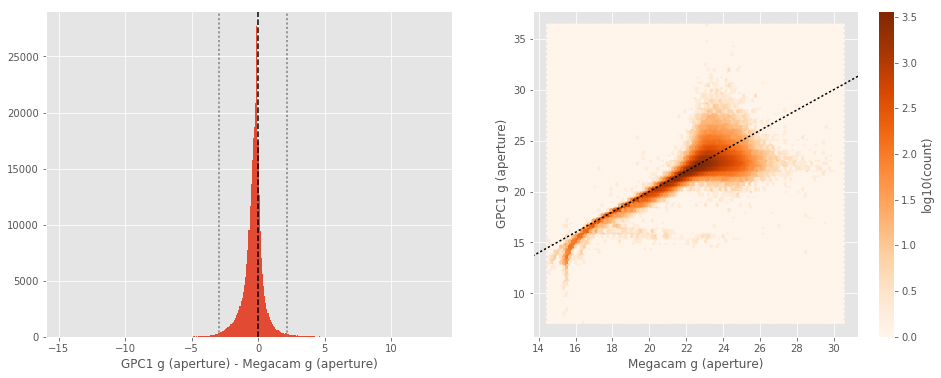

GPC1 g (total) - Megacam g (total):
- Median: 0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -3.06019718170166
- 99% percentile: 1.7561915969848596


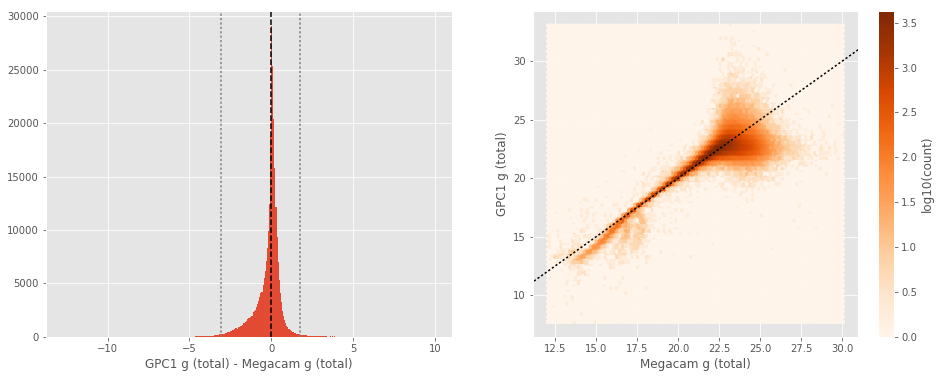

DECam g (aperture) - Megacam g (aperture):
- Median: -0.69
- Median Absolute Deviation: 0.21
- 1% percentile: -1.6604857635498047
- 99% percentile: 3.1951591873169067


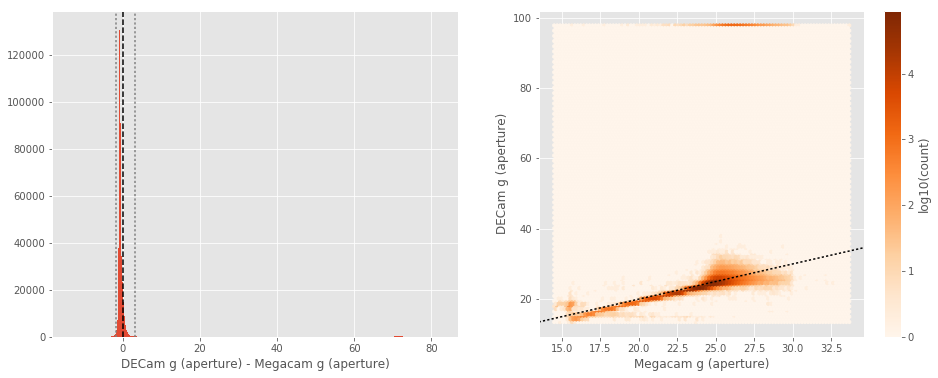

DECam g (total) - Megacam g (total):
- Median: 0.06
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2403174591064454
- 99% percentile: 1.996761093139662


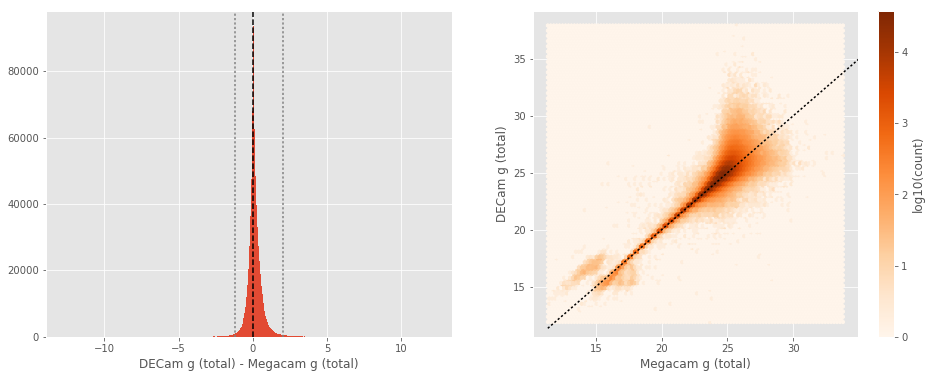

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.34
- Median Absolute Deviation: 0.40
- 1% percentile: -3.639123840332031
- 99% percentile: 2.1403845214843757


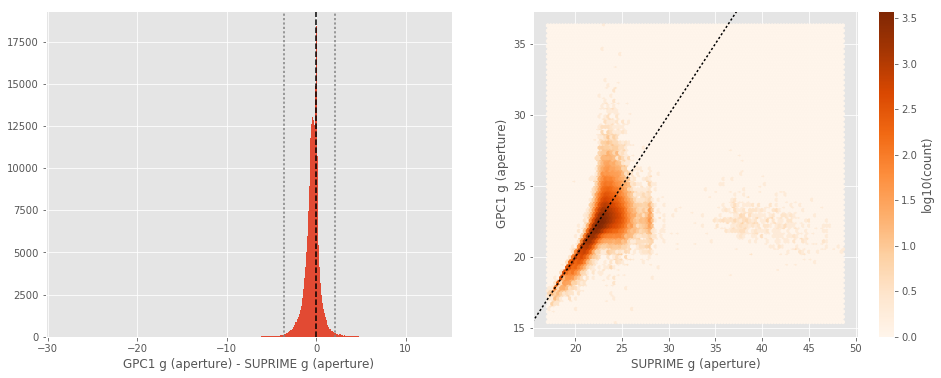

GPC1 g (total) - SUPRIME g (total):
- Median: 0.01
- Median Absolute Deviation: 0.28
- 1% percentile: -3.7444839477539062
- 99% percentile: 1.7457103729248047


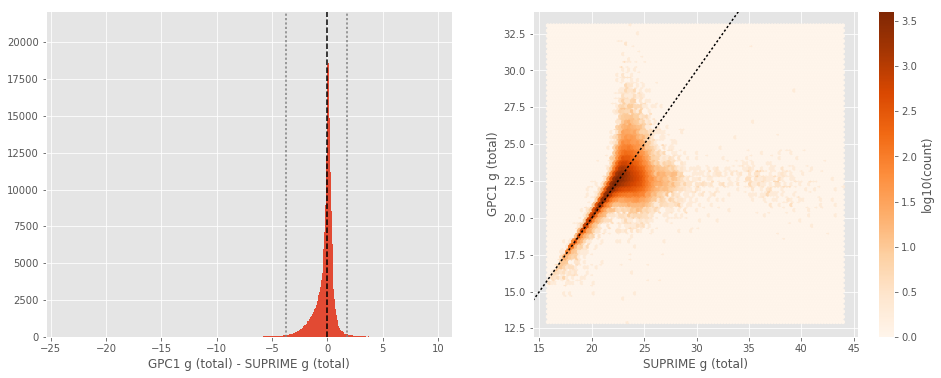

DECam g (aperture) - SUPRIME g (aperture):
- Median: -0.72
- Median Absolute Deviation: 0.19
- 1% percentile: -2.7974718761444093
- 99% percentile: 4.2402631664276225


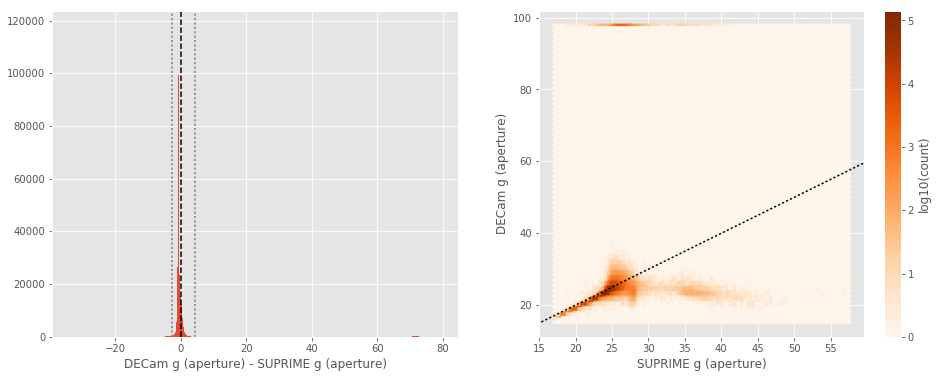

DECam g (total) - SUPRIME g (total):
- Median: 0.13
- Median Absolute Deviation: 0.22
- 1% percentile: -2.415642738342285
- 99% percentile: 2.1798274993896207


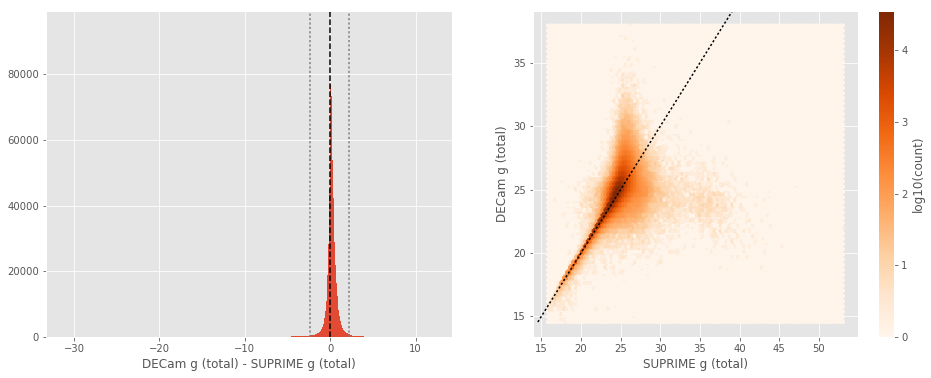

DECam g (aperture) - GPC1 g (aperture):
- Median: -0.44
- Median Absolute Deviation: 0.40
- 1% percentile: -2.9537939071655273
- 99% percentile: 3.5539972305297822


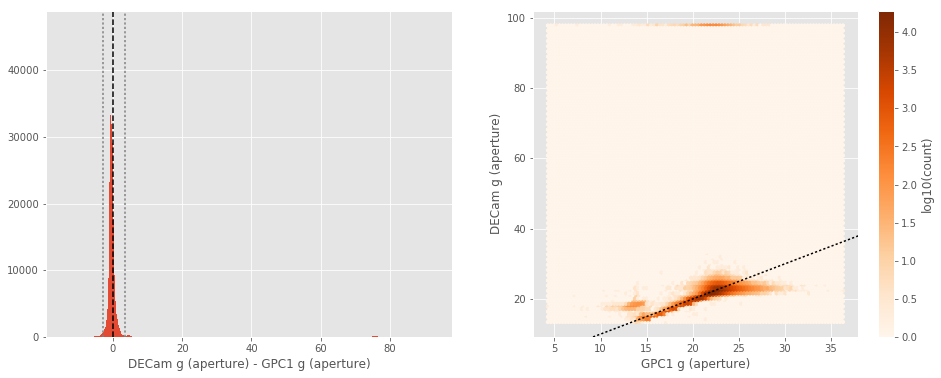

DECam g (total) - GPC1 g (total):
- Median: 0.00
- Median Absolute Deviation: 0.25
- 1% percentile: -1.7627371978759765
- 99% percentile: 3.31713991165161


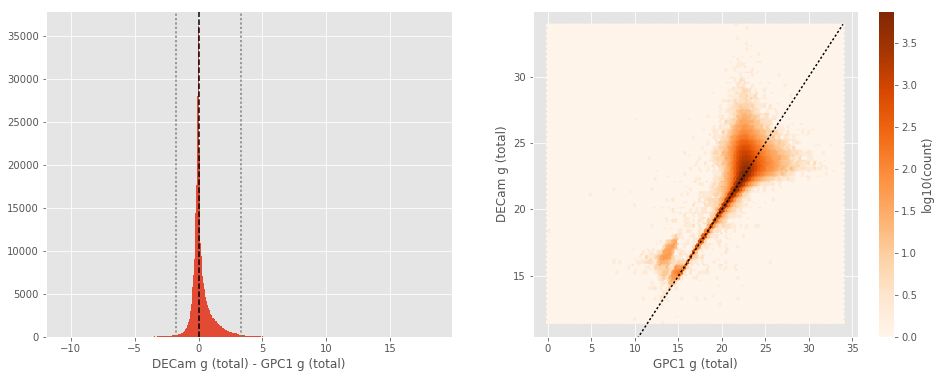

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -1.742109031677246
- 99% percentile: 1.9880001831054415


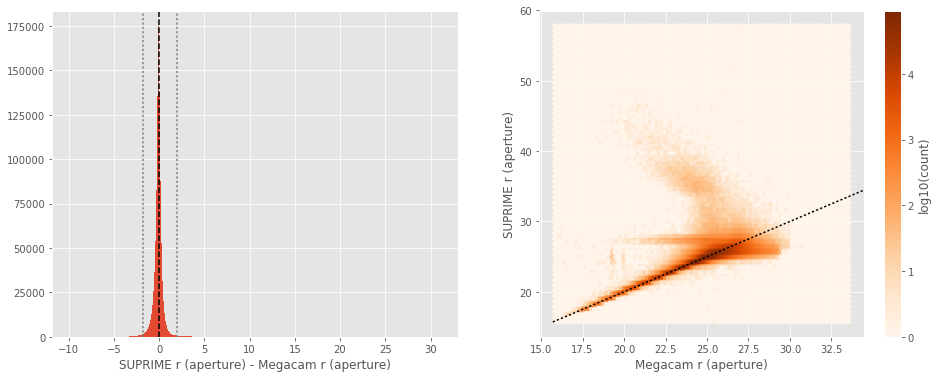

SUPRIME r (total) - Megacam r (total):
- Median: -0.11
- Median Absolute Deviation: 0.25
- 1% percentile: -2.4688263893127442
- 99% percentile: 2.418857765197753


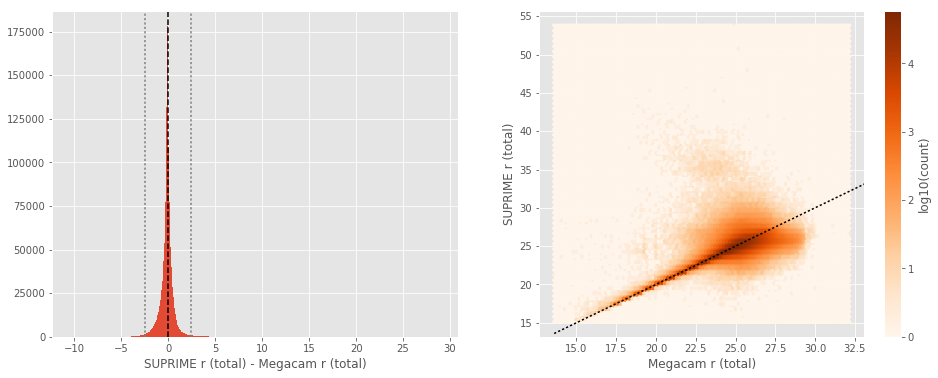

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6848388671875
- 99% percentile: 1.5249395370483423


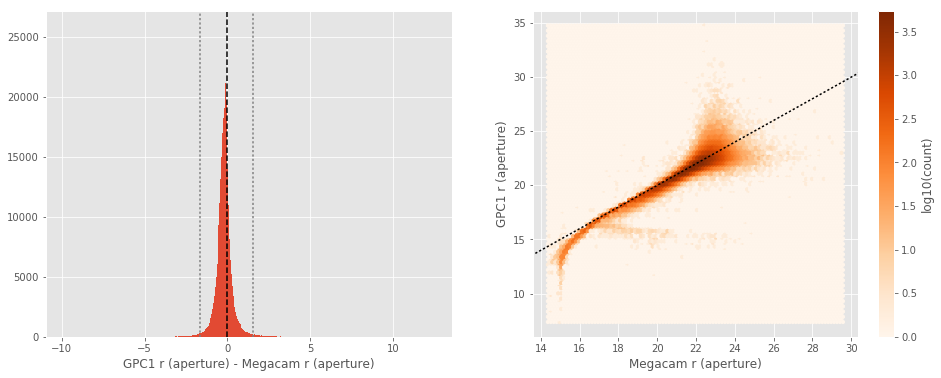

GPC1 r (total) - Megacam r (total):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.6984930419921875
- 99% percentile: 1.1222654724121097


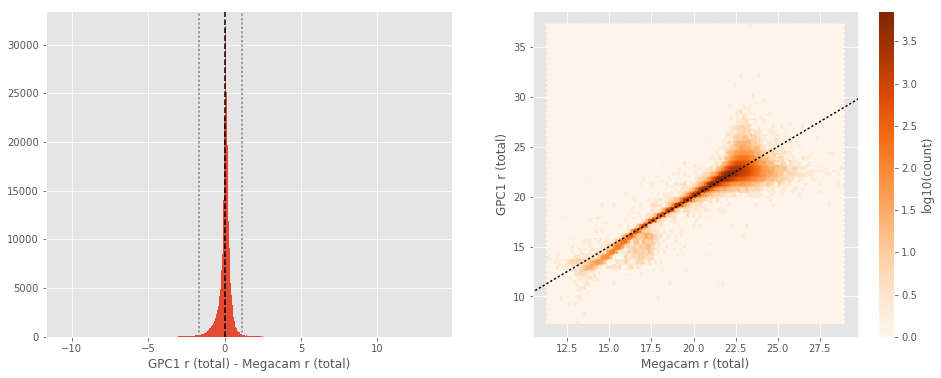

DECam r (aperture) - Megacam r (aperture):
- Median: -0.74
- Median Absolute Deviation: 0.19
- 1% percentile: -1.499849510192871
- 99% percentile: 2.023779010772715


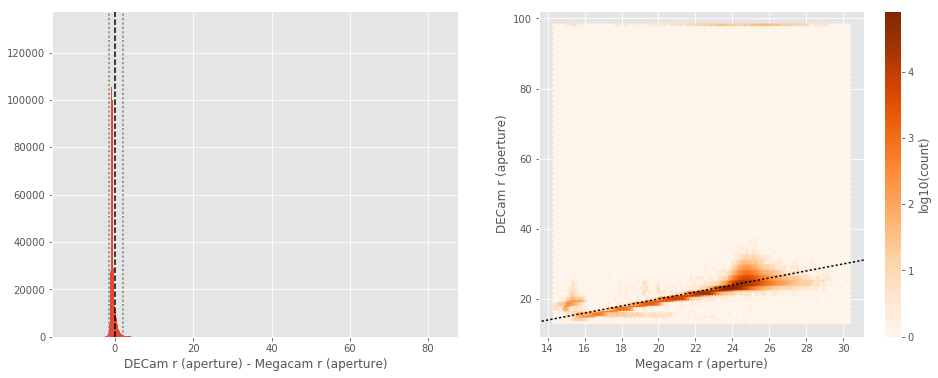

DECam r (total) - Megacam r (total):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1826844024658203
- 99% percentile: 1.3061718750000018


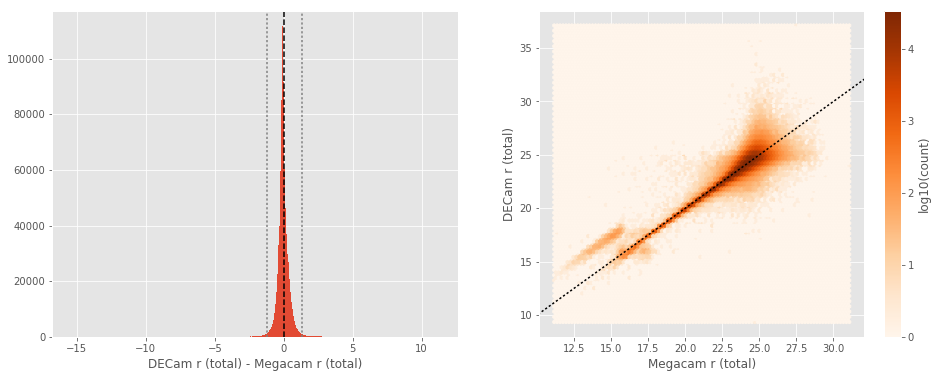

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -2.6933506774902343
- 99% percentile: 1.5765130996704086


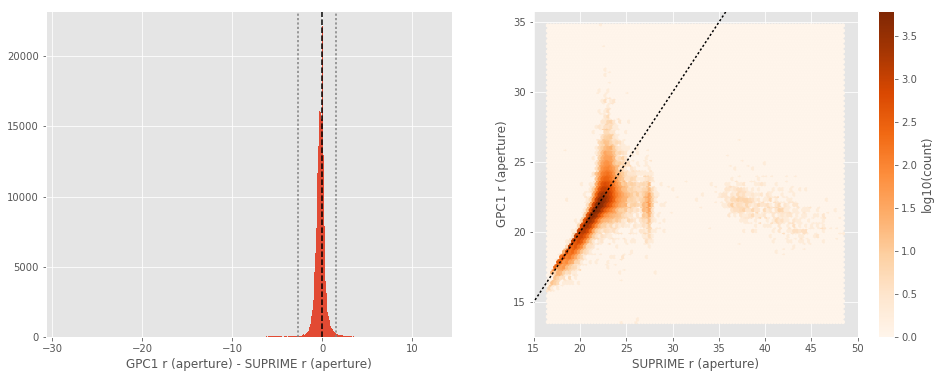

GPC1 r (total) - SUPRIME r (total):
- Median: 0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -2.7984001159667966
- 99% percentile: 1.156392478942872


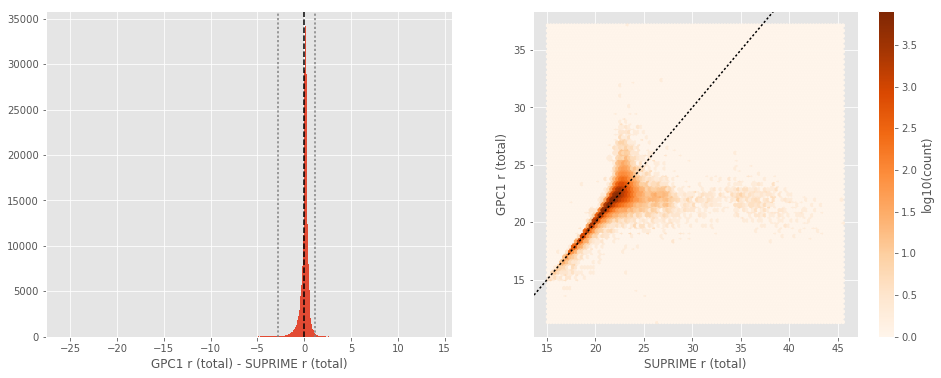

DECam r (aperture) - SUPRIME r (aperture):
- Median: -0.71
- Median Absolute Deviation: 0.15
- 1% percentile: -2.8059141731262205
- 99% percentile: 2.0467502212524407


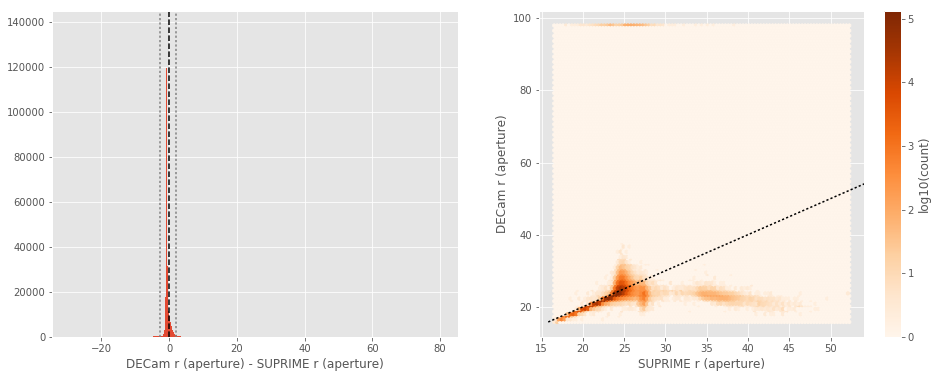

DECam r (total) - SUPRIME r (total):
- Median: 0.03
- Median Absolute Deviation: 0.20
- 1% percentile: -2.591495933532715
- 99% percentile: 1.5271593093872058


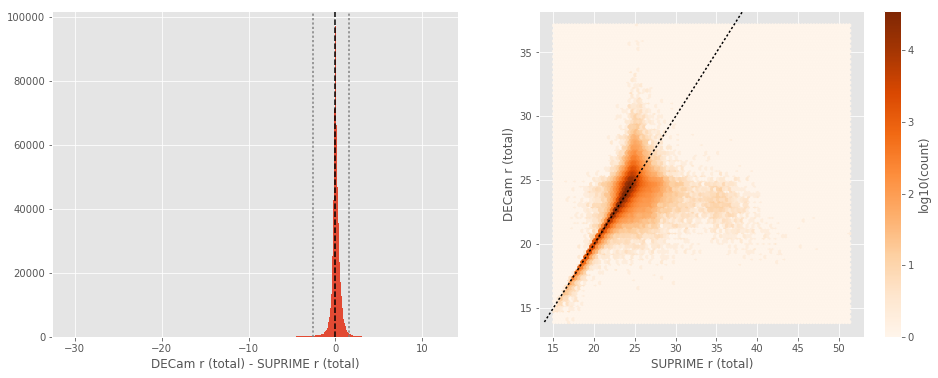

DECam r (aperture) - GPC1 r (aperture):
- Median: -0.59
- Median Absolute Deviation: 0.28
- 1% percentile: -2.368542022705078
- 99% percentile: 4.331733894348142


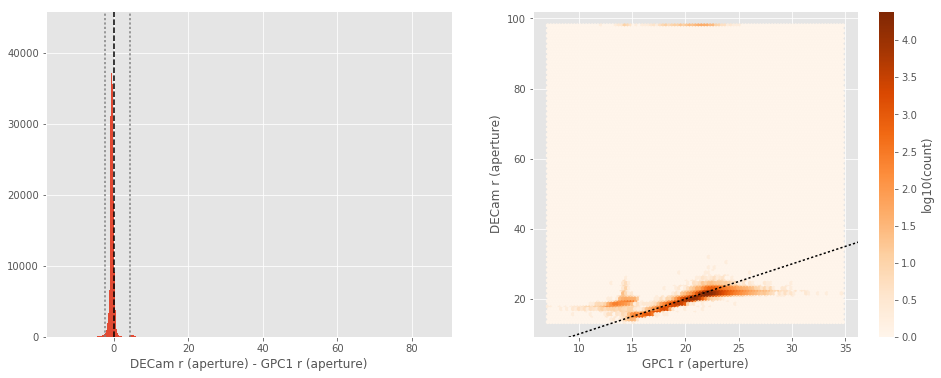

DECam r (total) - GPC1 r (total):
- Median: -0.17
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2592116928100585
- 99% percentile: 2.63348116874689


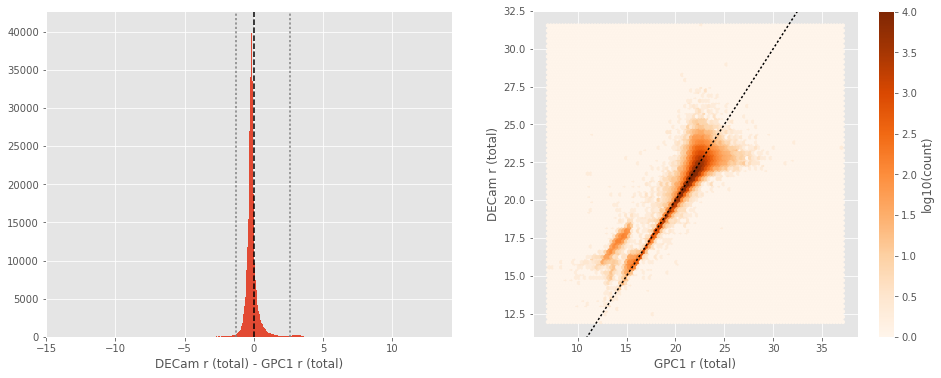

SUPRIME i (aperture) - Megacam i (aperture):
- Median: -0.01
- Median Absolute Deviation: 0.20
- 1% percentile: -1.9167745971679686
- 99% percentile: 2.583750457763667


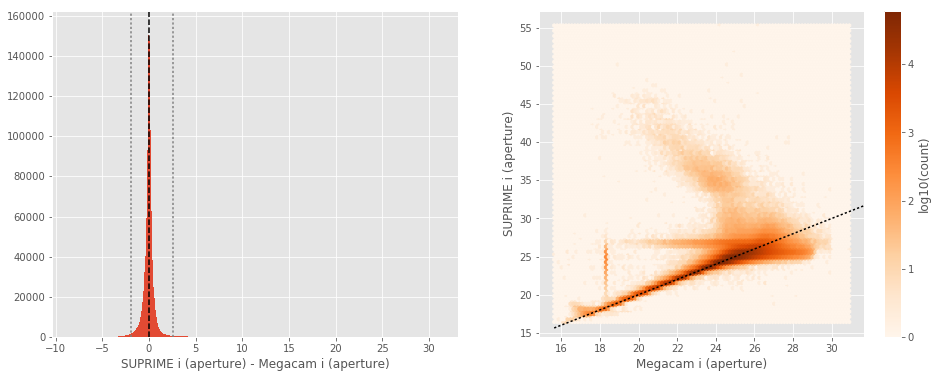

SUPRIME i (total) - Megacam i (total):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -2.636020736694336
- 99% percentile: 3.0796944999694906


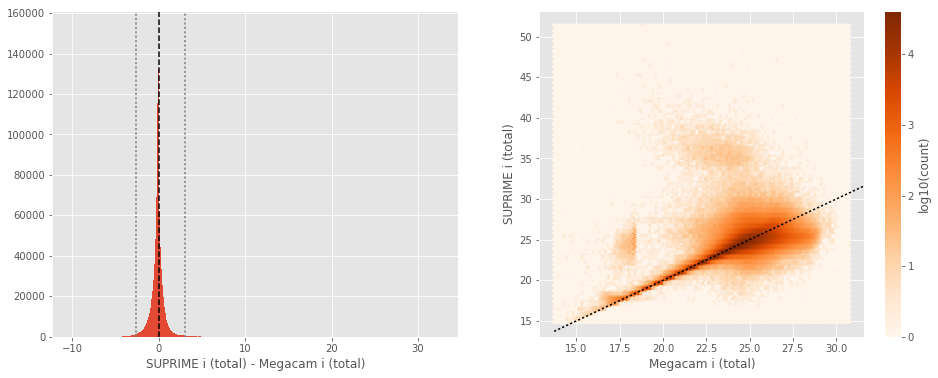

GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1029479217529294
- 99% percentile: 0.685467453002929


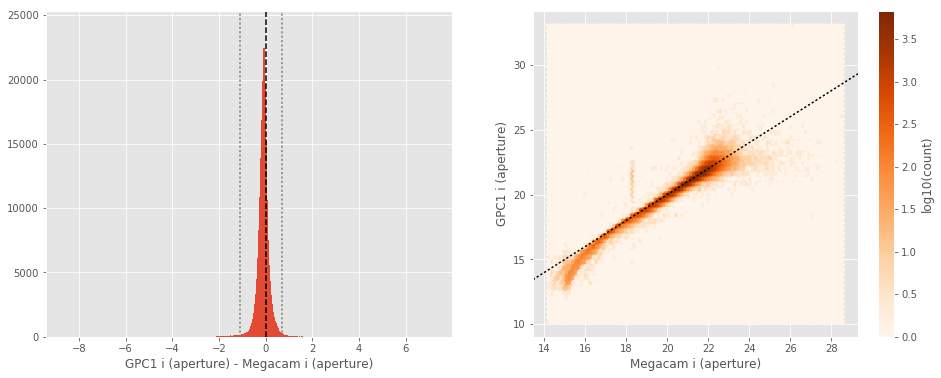

GPC1 i (total) - Megacam i (total):
- Median: 0.12
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8633080768585204
- 99% percentile: 0.7098007202148438


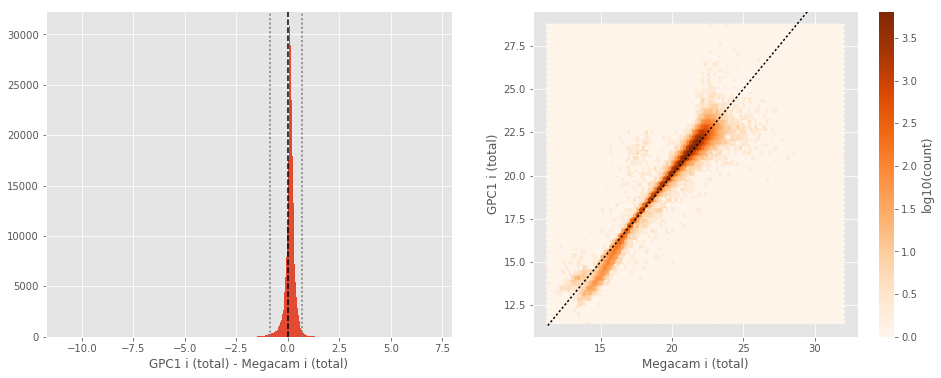

DECam i (aperture) - Megacam i (aperture):
- Median: -0.61
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2929137420654297
- 99% percentile: 0.11406608581542921


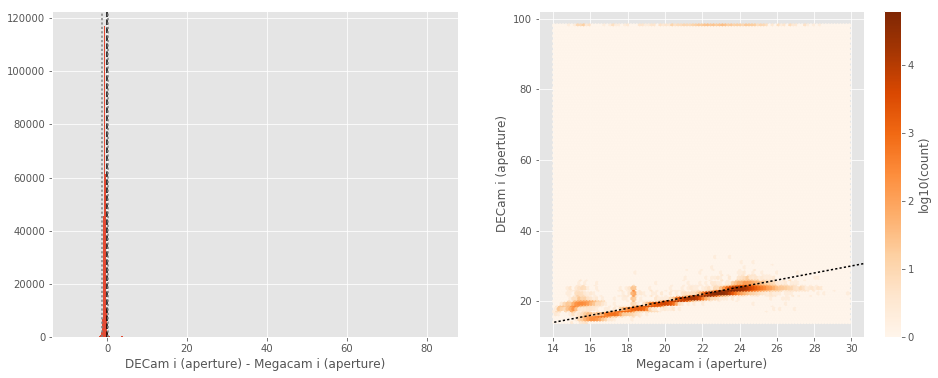

DECam i (total) - Megacam i (total):
- Median: -0.03
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9133071899414062
- 99% percentile: 1.193890991210937


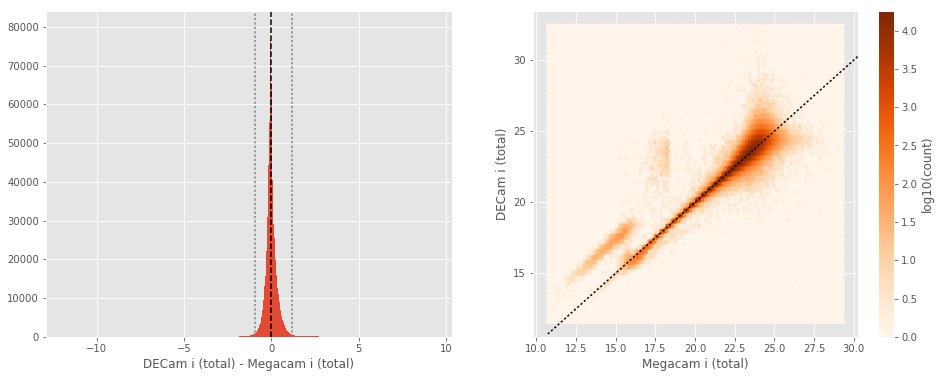

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -4.782311553955078
- 99% percentile: 0.6964526367187501


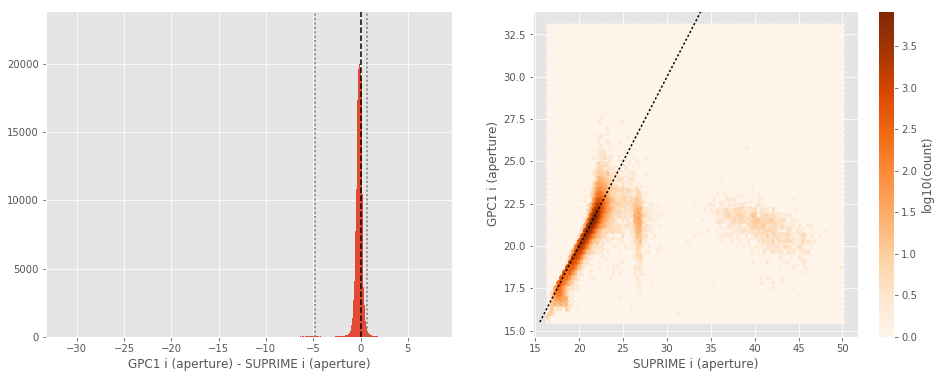

GPC1 i (total) - SUPRIME i (total):
- Median: 0.19
- Median Absolute Deviation: 0.11
- 1% percentile: -4.40062255859375
- 99% percentile: 0.7501157760620115


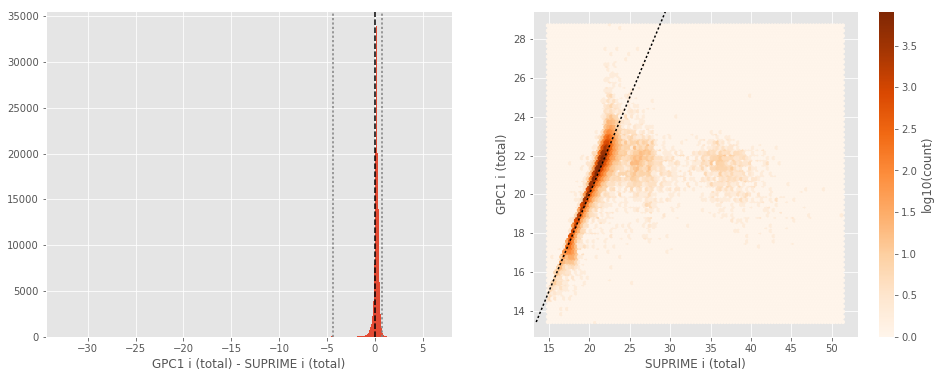

DECam i (aperture) - SUPRIME i (aperture):
- Median: -0.63
- Median Absolute Deviation: 0.09
- 1% percentile: -4.035024166107178
- 99% percentile: 0.00021341323852519523


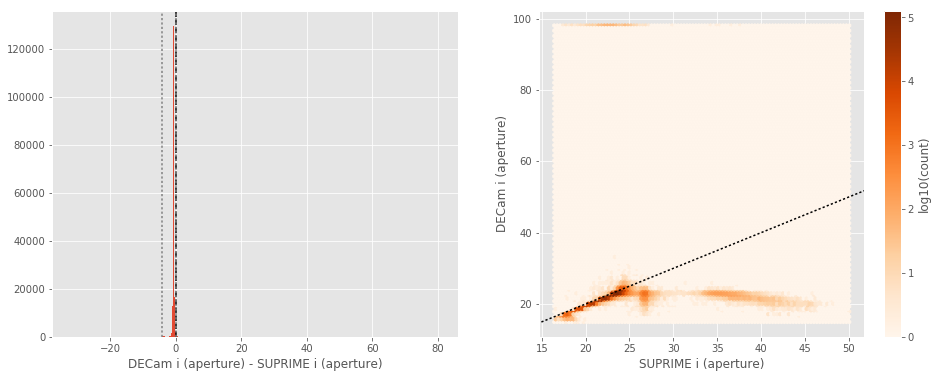

DECam i (total) - SUPRIME i (total):
- Median: 0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -3.5702020263671876
- 99% percentile: 1.1975541687011726


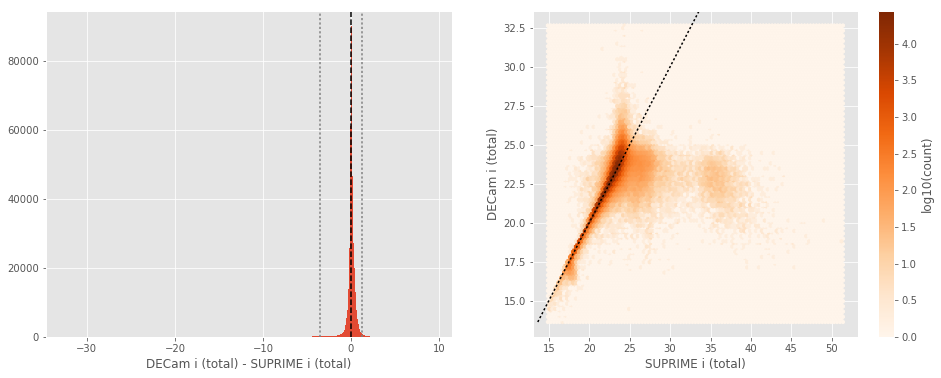

DECam i (aperture) - GPC1 i (aperture):
- Median: -0.52
- Median Absolute Deviation: 0.21
- 1% percentile: -1.3588998794555665
- 99% percentile: 4.742339572906491


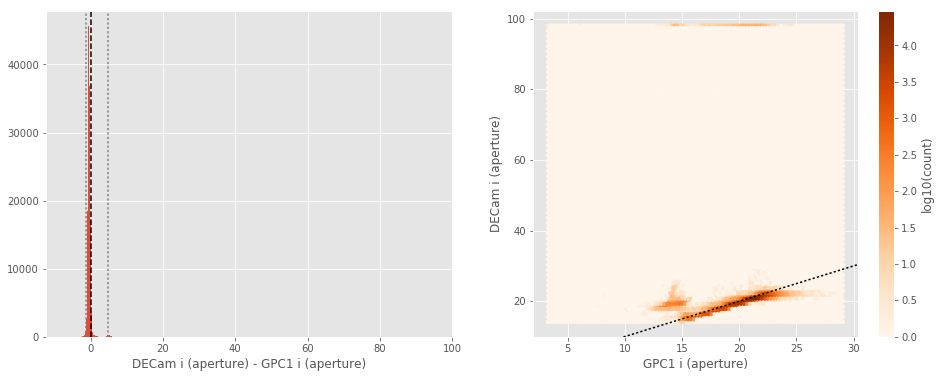

DECam i (total) - GPC1 i (total):
- Median: -0.17
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7713975334167481
- 99% percentile: 2.870612888336189


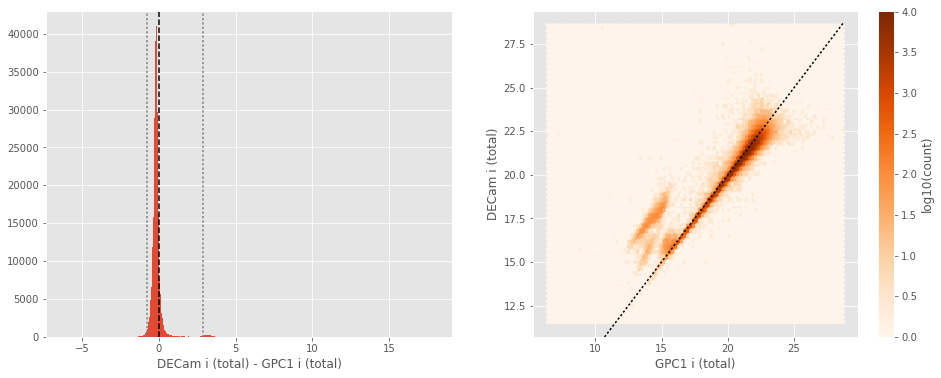

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.32
- 1% percentile: -2.4473641967773436
- 99% percentile: 3.3057684326171968


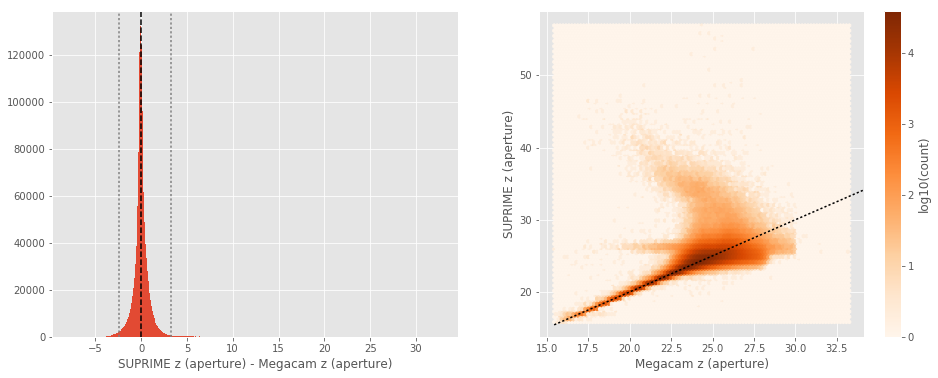

SUPRIME z (total) - Megacam z (total):
- Median: -0.07
- Median Absolute Deviation: 0.42
- 1% percentile: -2.9345621490478515
- 99% percentile: 3.2768844032287605


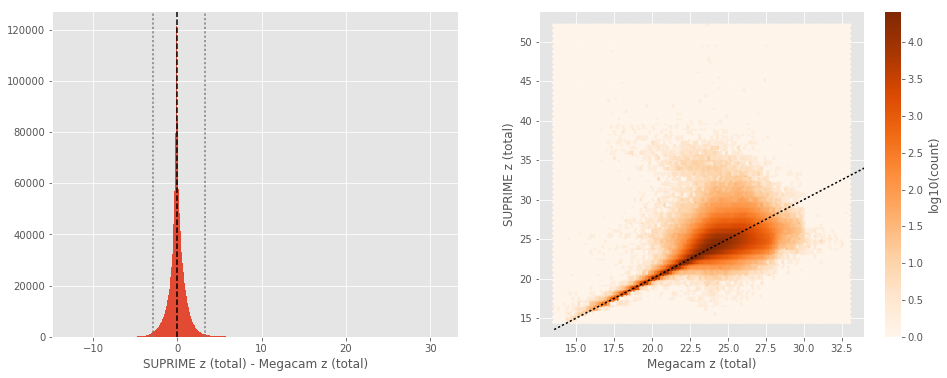

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2294002628326415
- 99% percentile: 0.9078834152221638


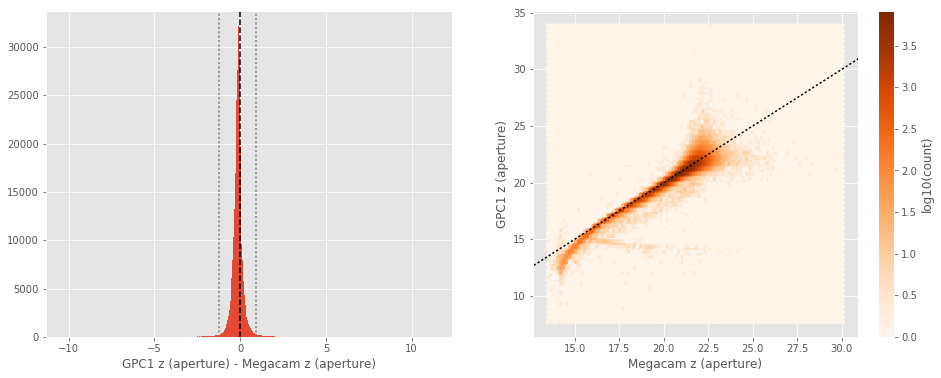

GPC1 z (total) - Megacam z (total):
- Median: 0.10
- Median Absolute Deviation: 0.12
- 1% percentile: -1.0423743438720703
- 99% percentile: 0.8805857849121095


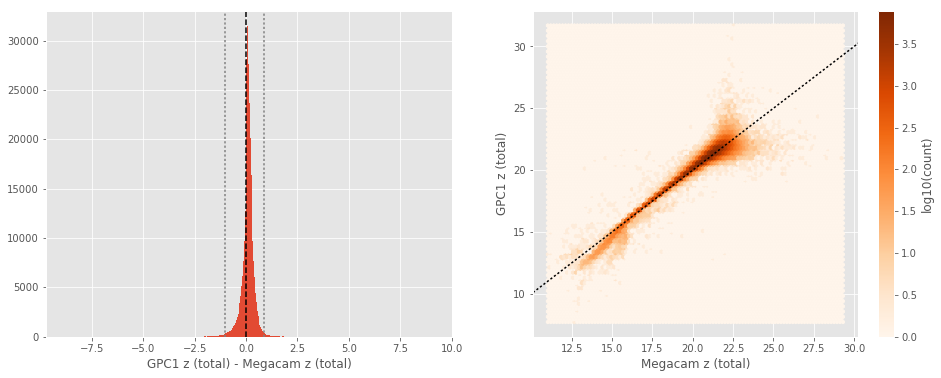

DECam z (aperture) - Megacam z (aperture):
- Median: -0.61
- Median Absolute Deviation: 0.22
- 1% percentile: -2.44248685836792
- 99% percentile: 2.53987770080567


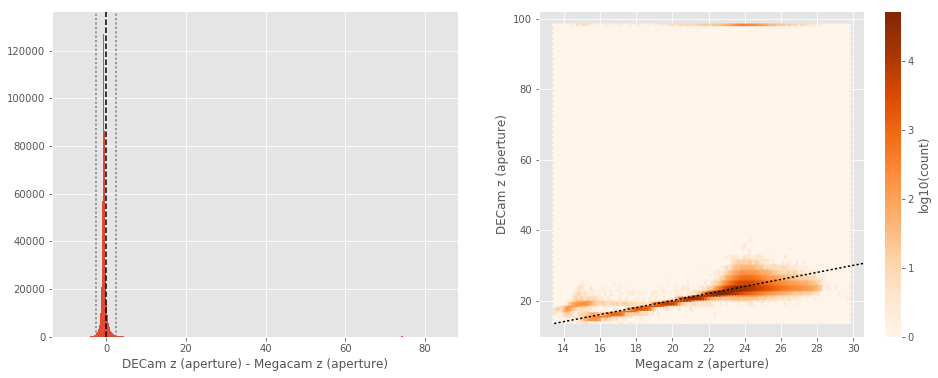

DECam z (total) - Megacam z (total):
- Median: -0.06
- Median Absolute Deviation: 0.27
- 1% percentile: -2.336660652160645
- 99% percentile: 2.3581460380554153


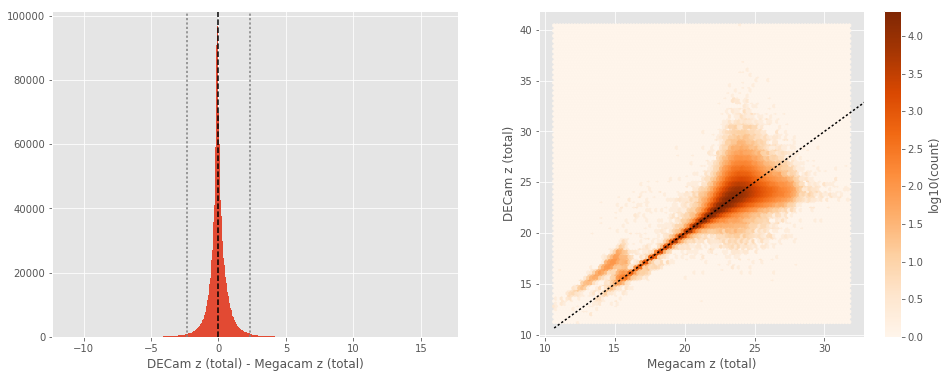

VISTA Z (aperture) - Megacam z (aperture):
- Median: 0.03
- Median Absolute Deviation: 0.23
- 1% percentile: -2.320587158203125
- 99% percentile: 5.04947128295899


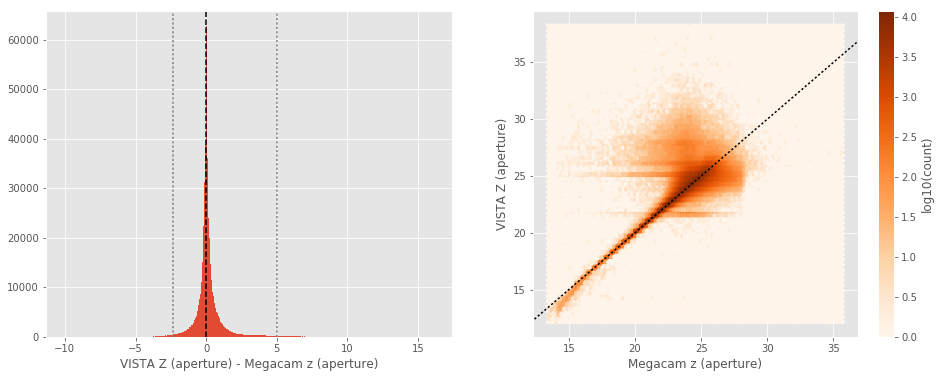

VISTA Z (total) - Megacam z (total):
- Median: 0.09
- Median Absolute Deviation: 0.33
- 1% percentile: -2.2615019607543947
- 99% percentile: 5.119704399108888


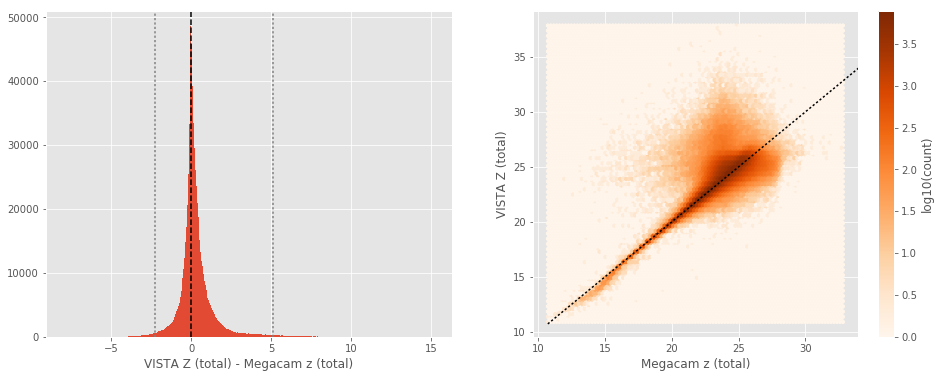

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -2.5658302307128906
- 99% percentile: 0.9683160781860352


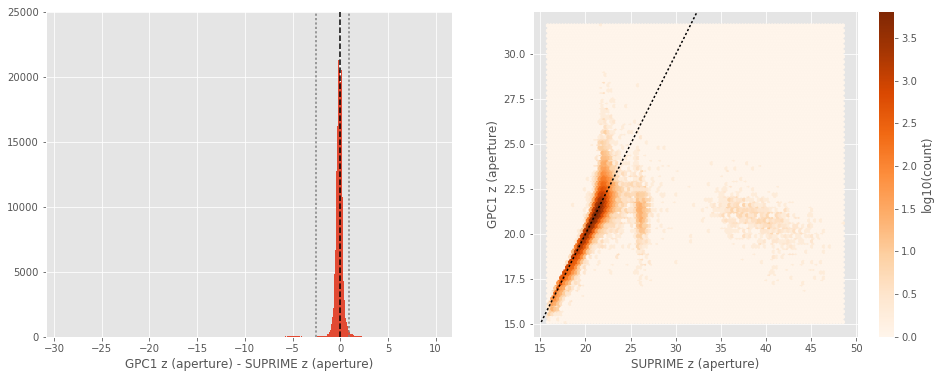

GPC1 z (total) - SUPRIME z (total):
- Median: 0.19
- Median Absolute Deviation: 0.13
- 1% percentile: -2.3962789916992184
- 99% percentile: 0.9102011489868165


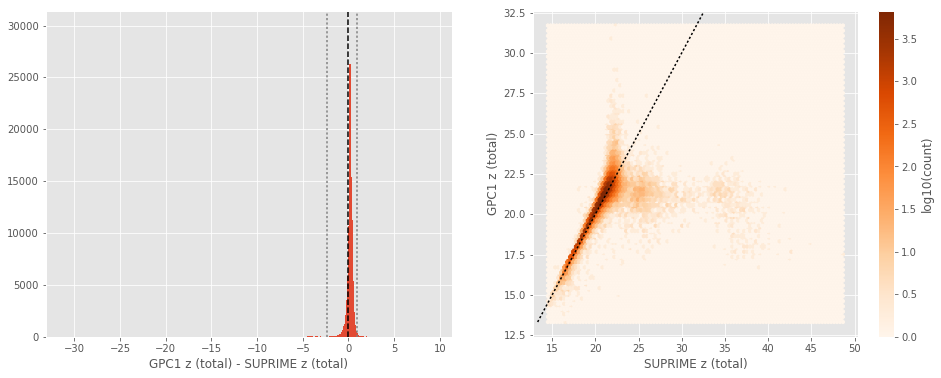

DECam z (aperture) - SUPRIME z (aperture):
- Median: -0.56
- Median Absolute Deviation: 0.16
- 1% percentile: -3.387274703979492
- 99% percentile: 2.3101416778564556


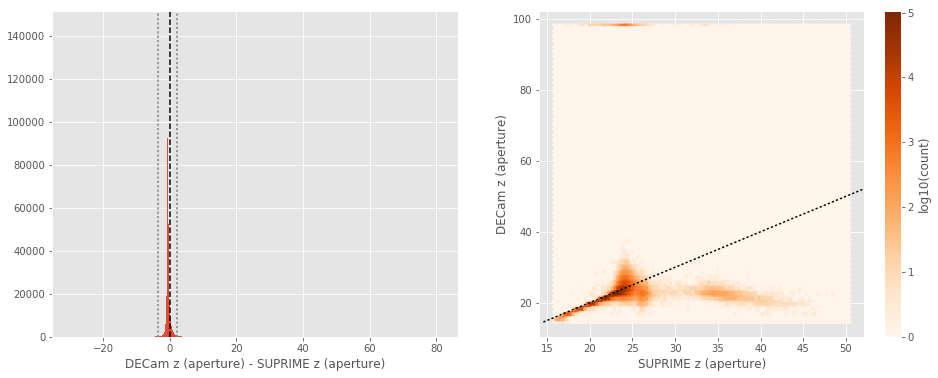

DECam z (total) - SUPRIME z (total):
- Median: 0.05
- Median Absolute Deviation: 0.24
- 1% percentile: -2.773913402557373
- 99% percentile: 2.3759144401550416


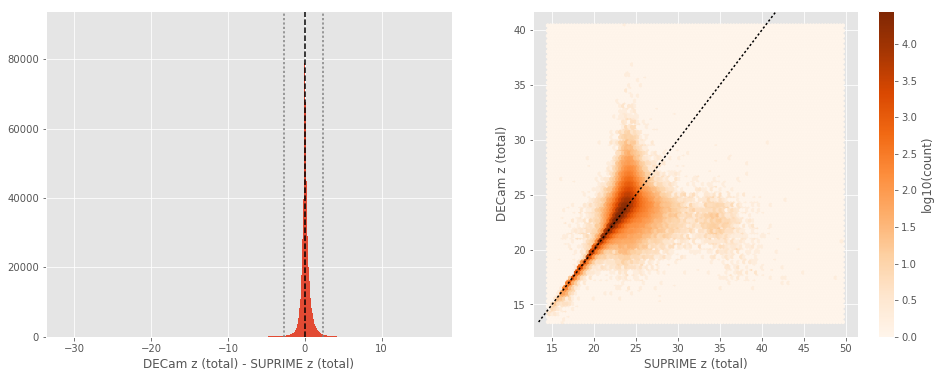

VISTA Z (aperture) - SUPRIME z (aperture):
- Median: 0.06
- Median Absolute Deviation: 0.18
- 1% percentile: -2.5930406188964845
- 99% percentile: 4.7979587554931635


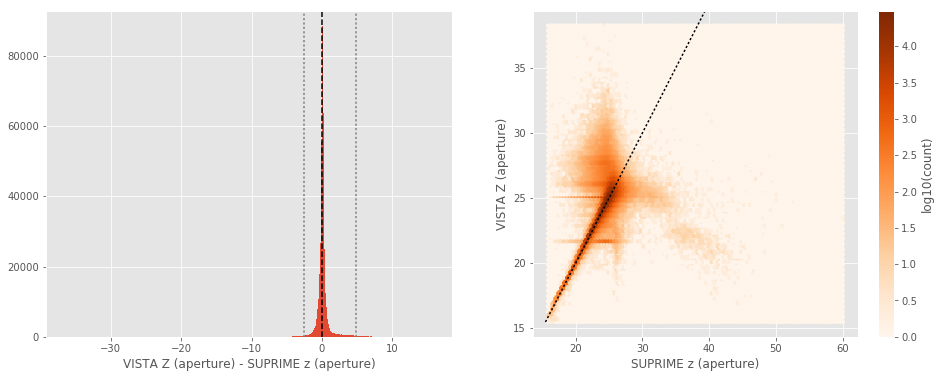

VISTA Z (total) - SUPRIME z (total):
- Median: 0.15
- Median Absolute Deviation: 0.29
- 1% percentile: -2.6688210487365724
- 99% percentile: 5.023596191406246


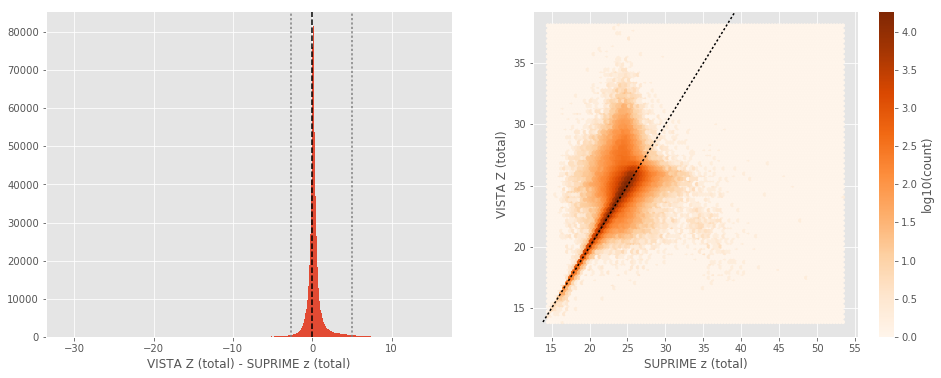

DECam z (aperture) - GPC1 z (aperture):
- Median: -0.47
- Median Absolute Deviation: 0.21
- 1% percentile: -1.5660935211181641
- 99% percentile: 4.5816224670410195


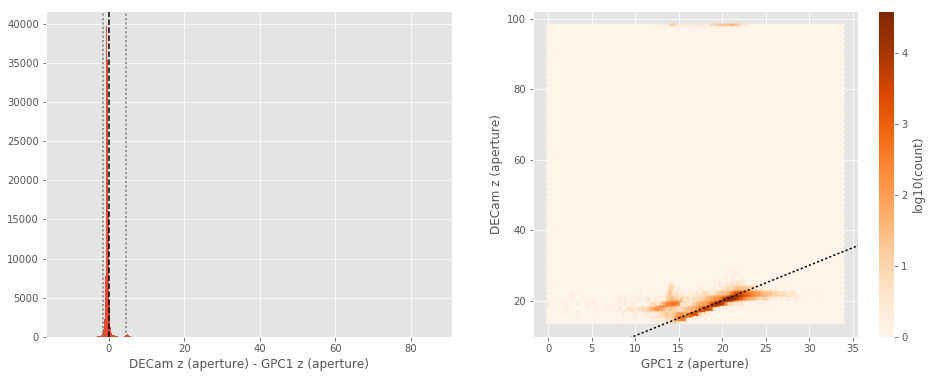

DECam z (total) - GPC1 z (total):
- Median: -0.18
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9743919372558594
- 99% percentile: 2.6836819648742676


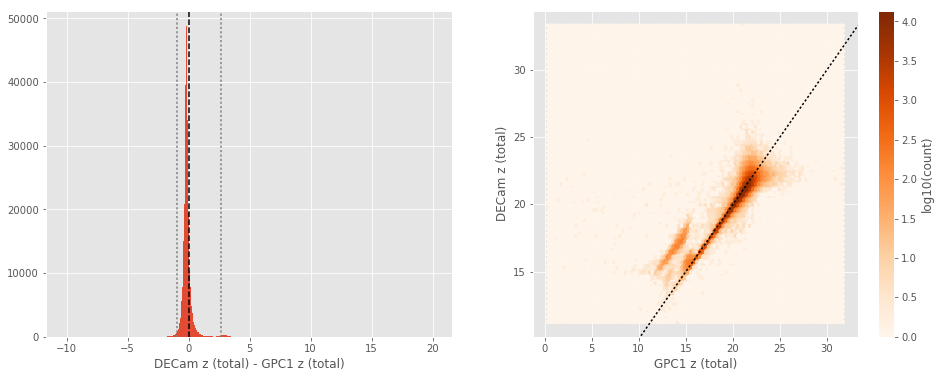

VISTA Z (aperture) - GPC1 z (aperture):
- Median: 0.14
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8947850036621094
- 99% percentile: 7.704527797698972


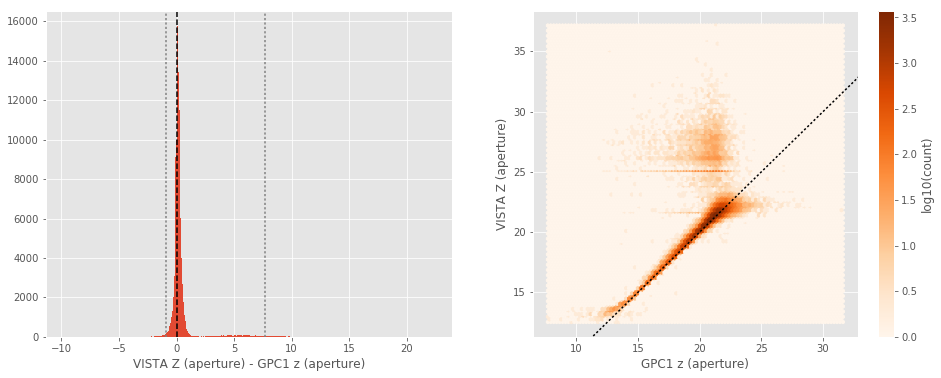

VISTA Z (total) - GPC1 z (total):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -0.985249137878418
- 99% percentile: 6.87569351196289


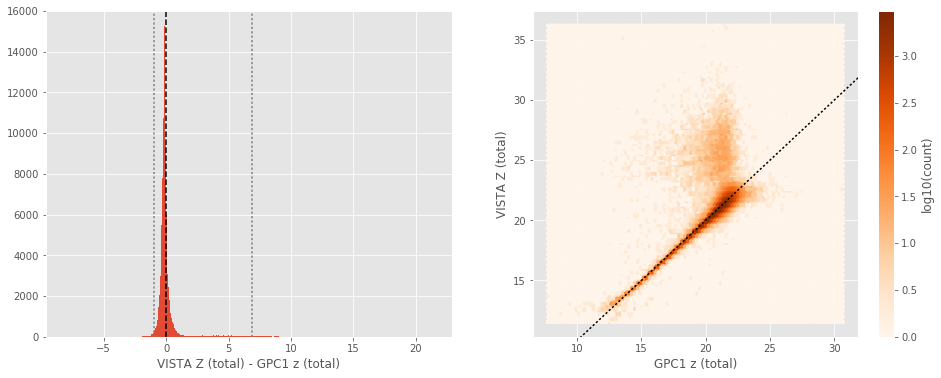

VISTA Z (aperture) - DECam z (aperture):
- Median: 0.61
- Median Absolute Deviation: 0.18
- 1% percentile: -2.598921012878418
- 99% percentile: 6.422013816833486


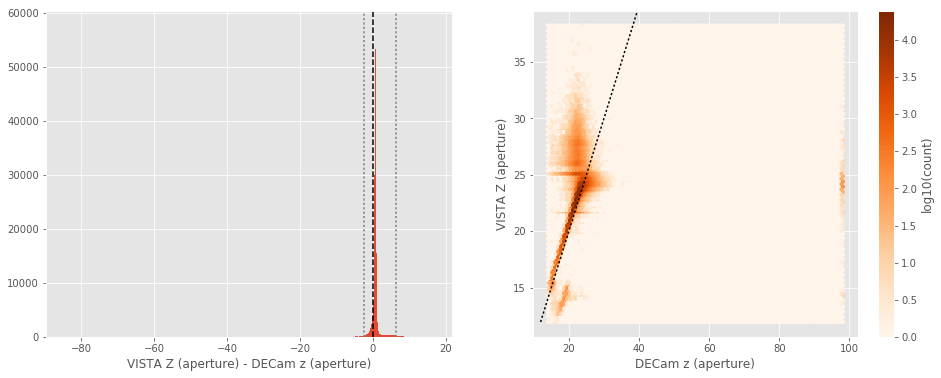

VISTA Z (total) - DECam z (total):
- Median: 0.06
- Median Absolute Deviation: 0.23
- 1% percentile: -2.1601175689697265
- 99% percentile: 5.6533683776855455


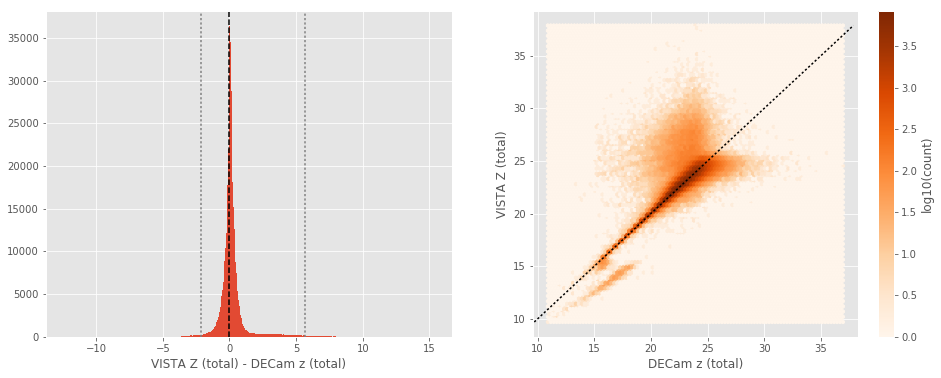

SUPRIME y (aperture) - Megacam y (aperture):
- Median: -0.44
- Median Absolute Deviation: 0.38
- 1% percentile: -2.362483768463135
- 99% percentile: 4.718506317138713


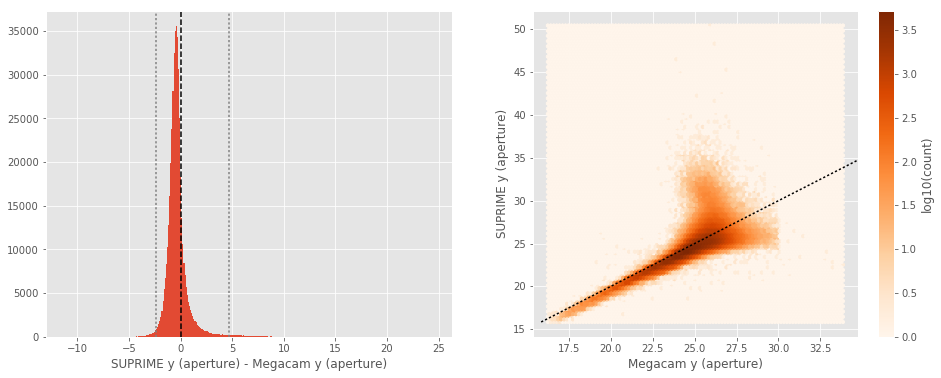

SUPRIME y (total) - Megacam y (total):
- Median: -0.51
- Median Absolute Deviation: 0.43
- 1% percentile: -3.4871426582336427
- 99% percentile: 2.9167009544372267


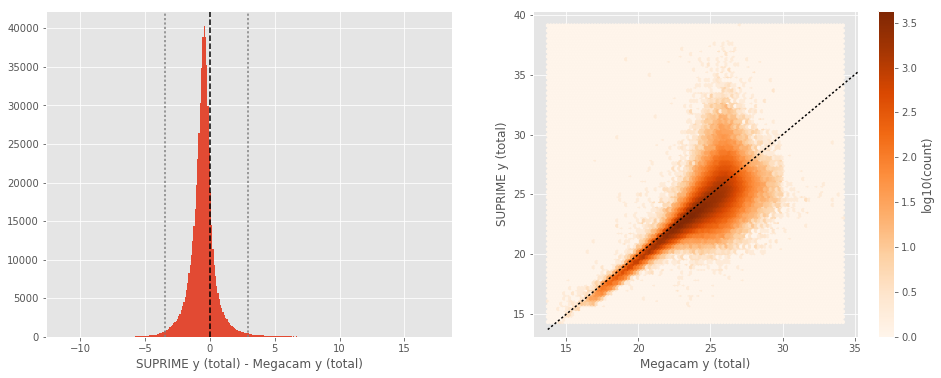

GPC1 y (aperture) - Megacam y (aperture):
- Median: -0.85
- Median Absolute Deviation: 0.33
- 1% percentile: -3.60290412902832
- 99% percentile: 1.2515487289428668


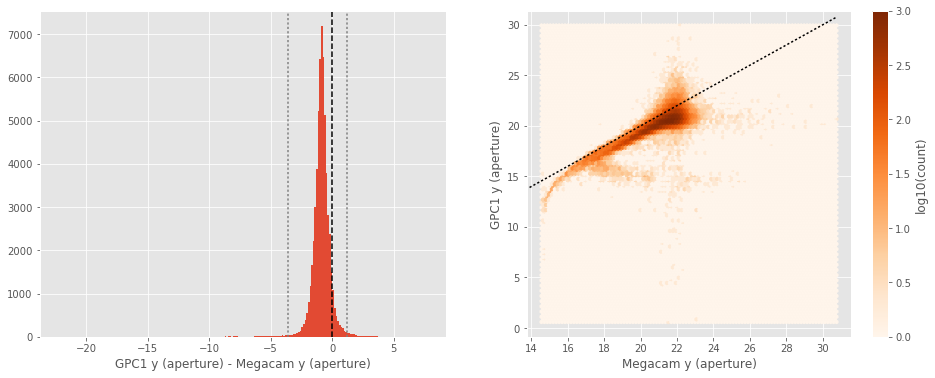

GPC1 y (total) - Megacam y (total):
- Median: -0.47
- Median Absolute Deviation: 0.38
- 1% percentile: -2.7168086242675784
- 99% percentile: 1.4016079711914065


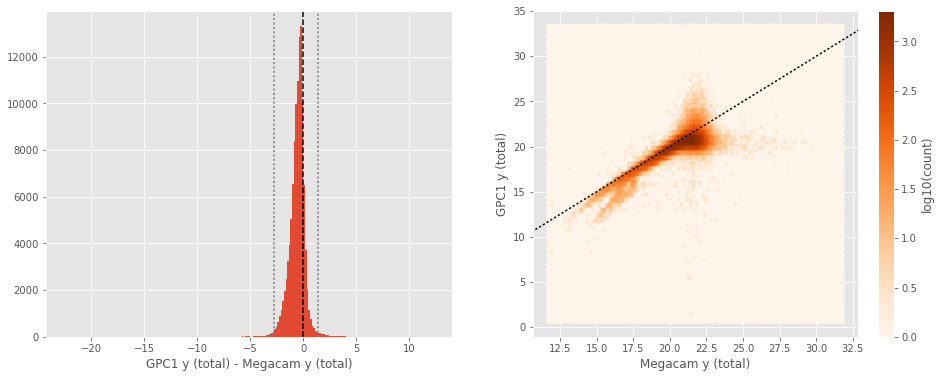

DECam y (aperture) - Megacam y (aperture):
- Median: -1.05
- Median Absolute Deviation: 0.43
- 1% percentile: -2.6363630294799805
- 99% percentile: 74.633607006073


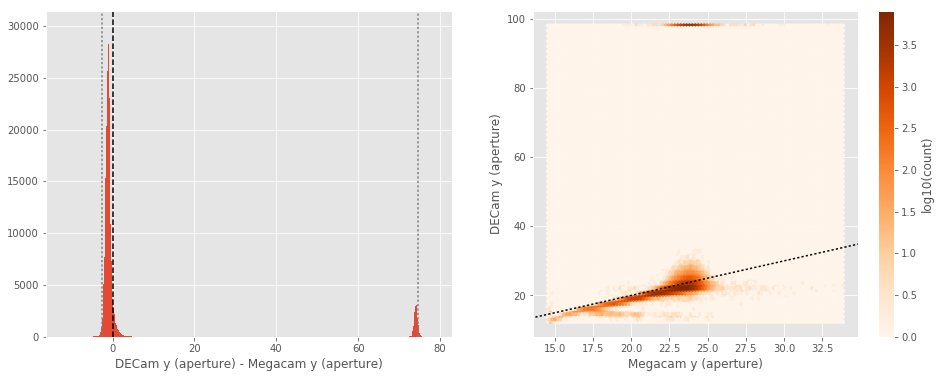

DECam y (total) - Megacam y (total):
- Median: -0.43
- Median Absolute Deviation: 0.42
- 1% percentile: -2.306287536621094
- 99% percentile: 2.8485866546630865


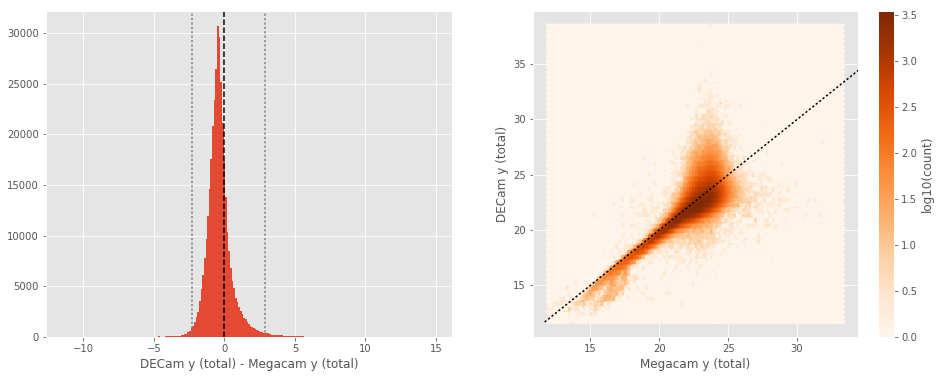

VISTA Y (aperture) - Megacam y (aperture):
- Median: -0.39
- Median Absolute Deviation: 0.30
- 1% percentile: -1.8950813293457032
- 99% percentile: 1.2401432037353475


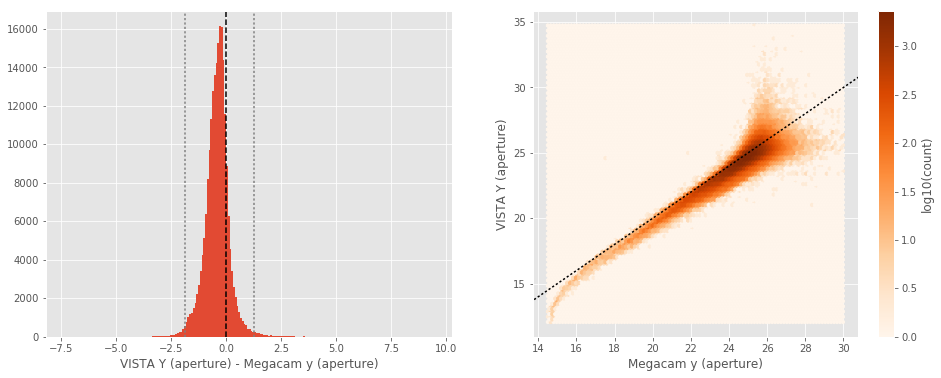

VISTA Y (total) - Megacam y (total):
- Median: -0.33
- Median Absolute Deviation: 0.33
- 1% percentile: -1.9636022949218748
- 99% percentile: 1.0820082664489747


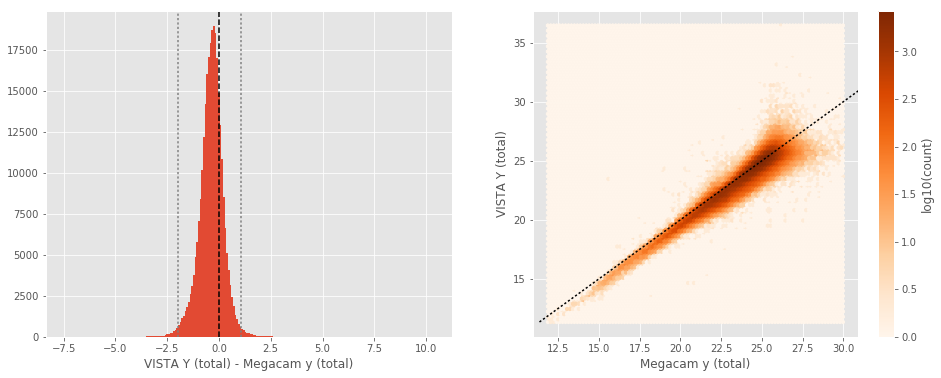

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.29
- Median Absolute Deviation: 0.32
- 1% percentile: -2.0795293426513672
- 99% percentile: 1.6715580368041985


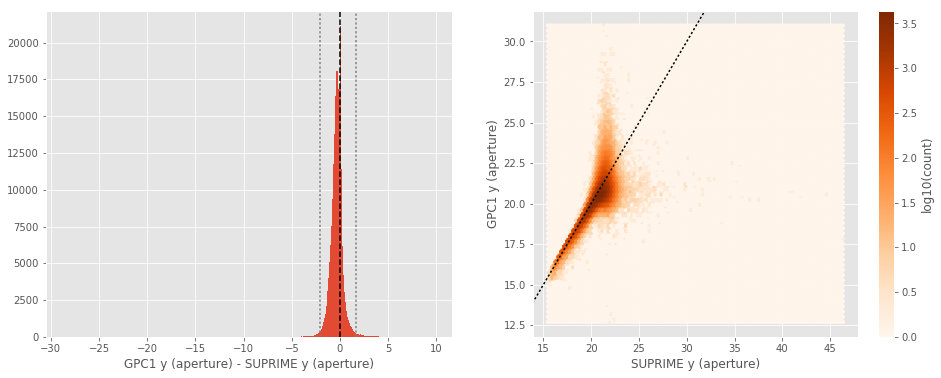

GPC1 y (total) - SUPRIME y (total):
- Median: 0.07
- Median Absolute Deviation: 0.29
- 1% percentile: -2.287841911315918
- 99% percentile: 1.6782851028442474


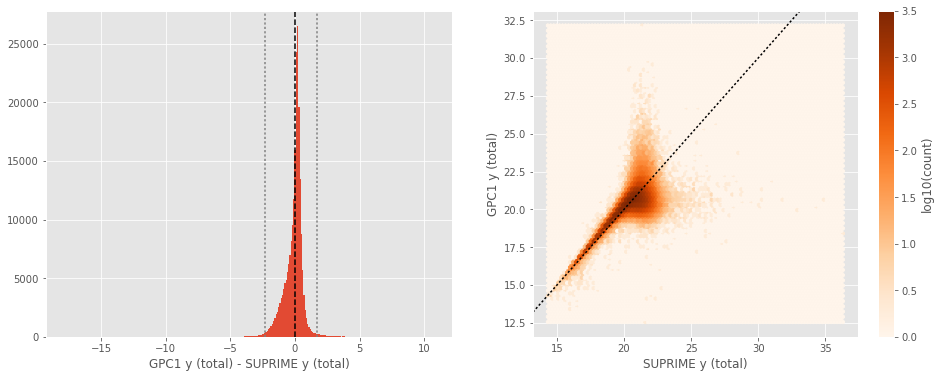

DECam y (aperture) - SUPRIME y (aperture):
- Median: -0.53
- Median Absolute Deviation: 0.30
- 1% percentile: -2.0791308593749998
- 99% percentile: 75.03467849731446


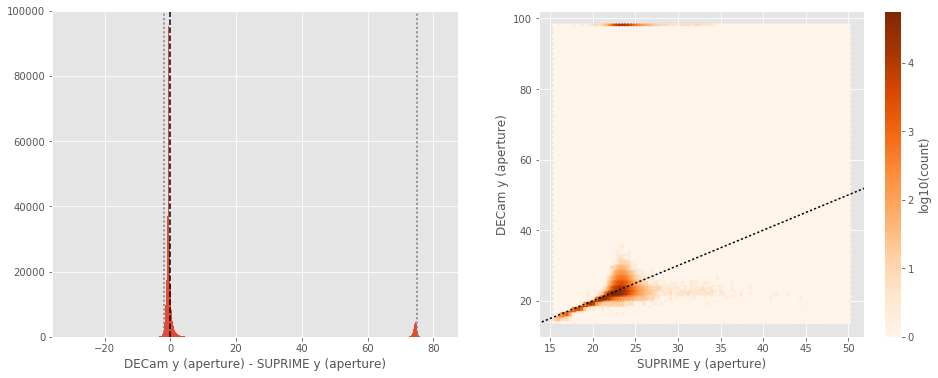

DECam y (total) - SUPRIME y (total):
- Median: 0.09
- Median Absolute Deviation: 0.35
- 1% percentile: -2.003104705810547
- 99% percentile: 3.3683034896850517


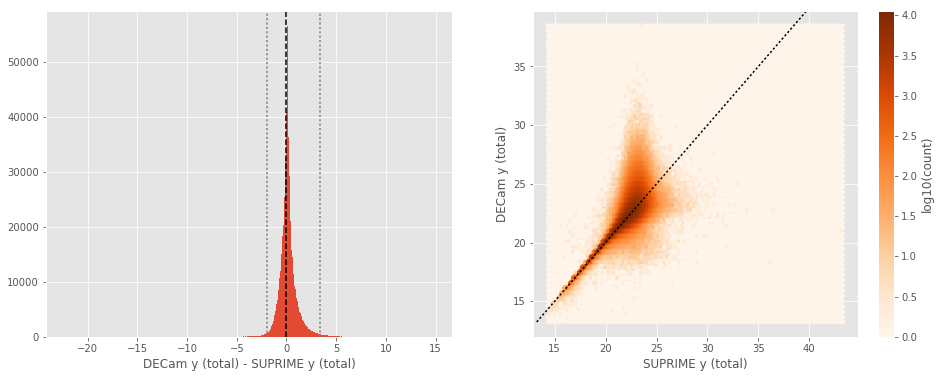

VISTA Y (aperture) - SUPRIME y (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.23
- 1% percentile: -3.0860182189941407
- 99% percentile: 1.69501480102539


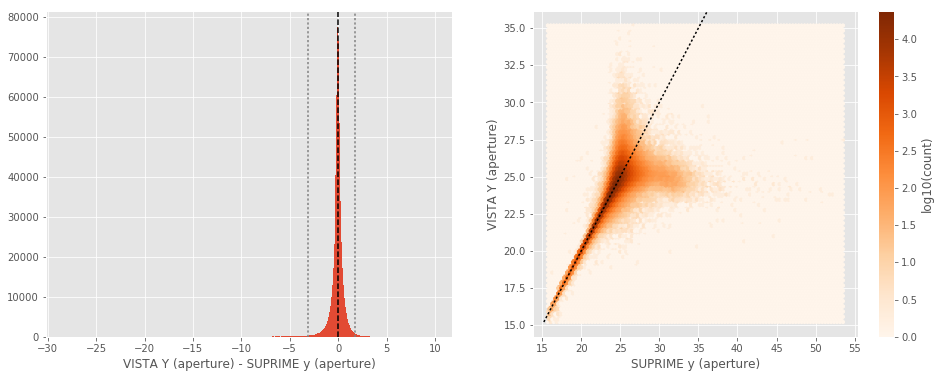

VISTA Y (total) - SUPRIME y (total):
- Median: 0.10
- Median Absolute Deviation: 0.33
- 1% percentile: -2.866960906982422
- 99% percentile: 2.791378784179689


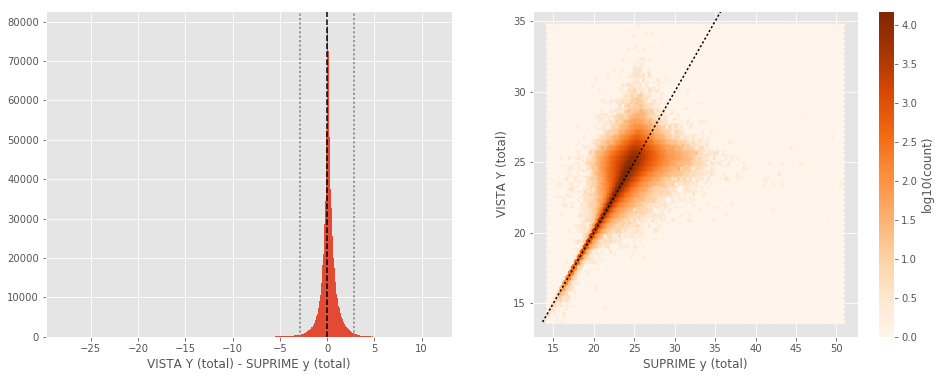

DECam y (aperture) - GPC1 y (aperture):
- Median: -0.28
- Median Absolute Deviation: 0.33
- 1% percentile: -2.190694351196289
- 99% percentile: 2.082874145507814


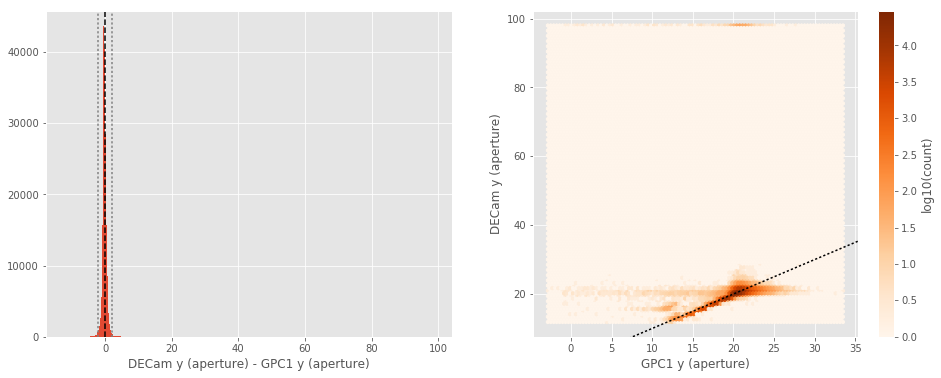

DECam y (total) - GPC1 y (total):
- Median: -0.02
- Median Absolute Deviation: 0.28
- 1% percentile: -1.6513774299621582
- 99% percentile: 2.8470756530761747


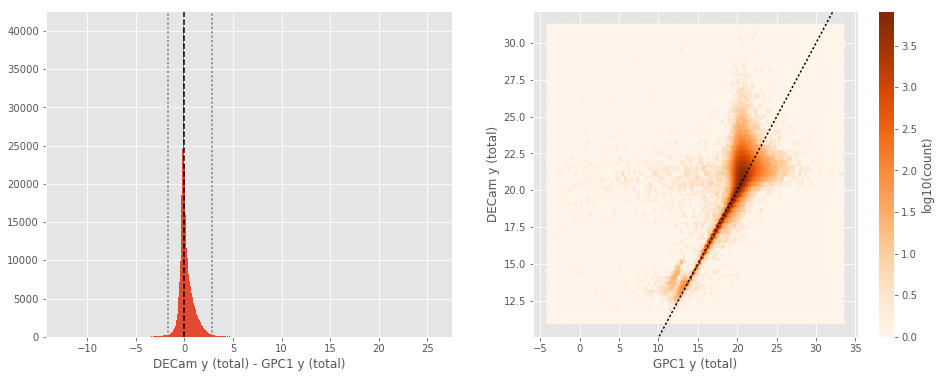

VISTA Y (aperture) - GPC1 y (aperture):
- Median: 0.20
- Median Absolute Deviation: 0.25
- 1% percentile: -1.5718774795532227
- 99% percentile: 1.913691043853757


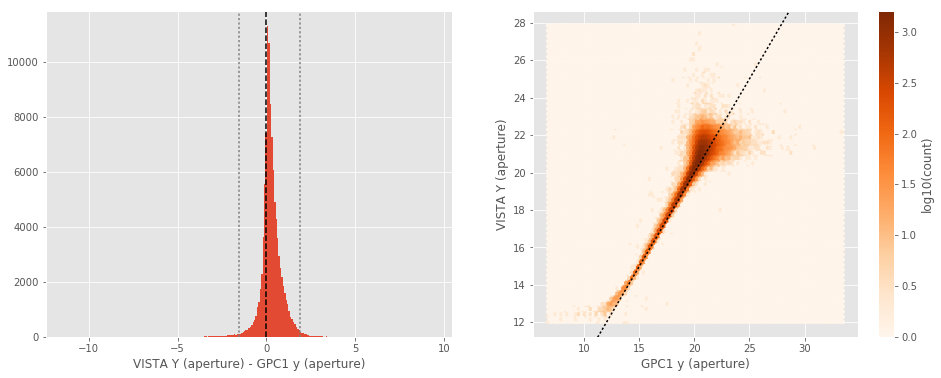

VISTA Y (total) - GPC1 y (total):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -1.6907672309875488
- 99% percentile: 2.282295455932616


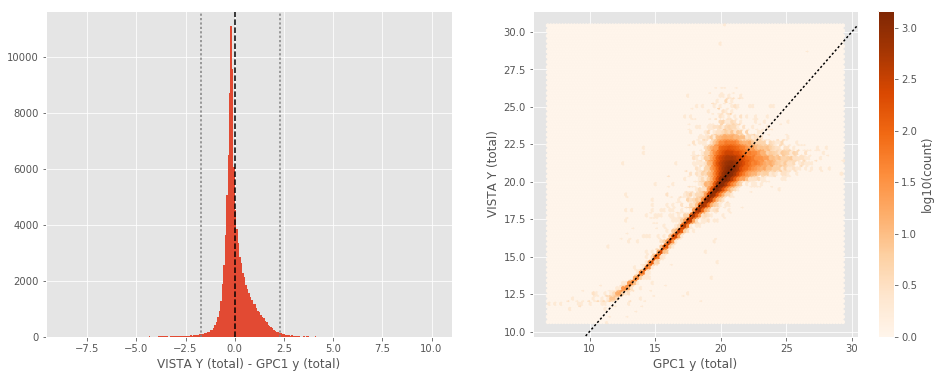

VISTA Y (aperture) - DECam y (aperture):
- Median: 0.47
- Median Absolute Deviation: 0.27
- 1% percentile: -74.97550397872925
- 99% percentile: 1.8864742851257323


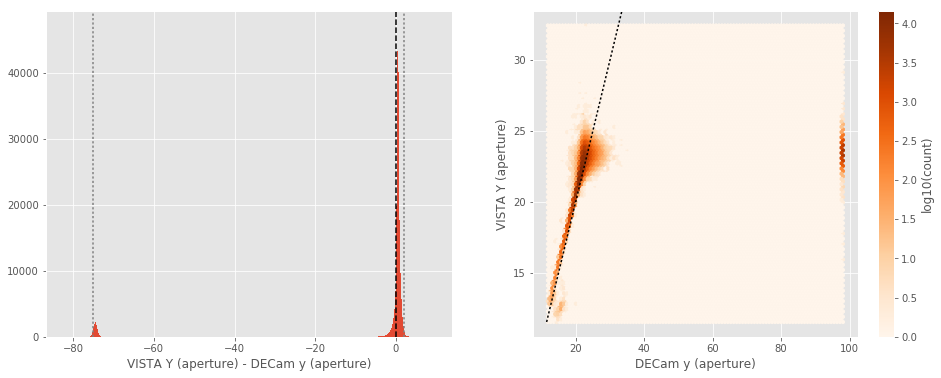

VISTA Y (total) - DECam y (total):
- Median: -0.09
- Median Absolute Deviation: 0.31
- 1% percentile: -3.1522443580627444
- 99% percentile: 1.7546649742126452


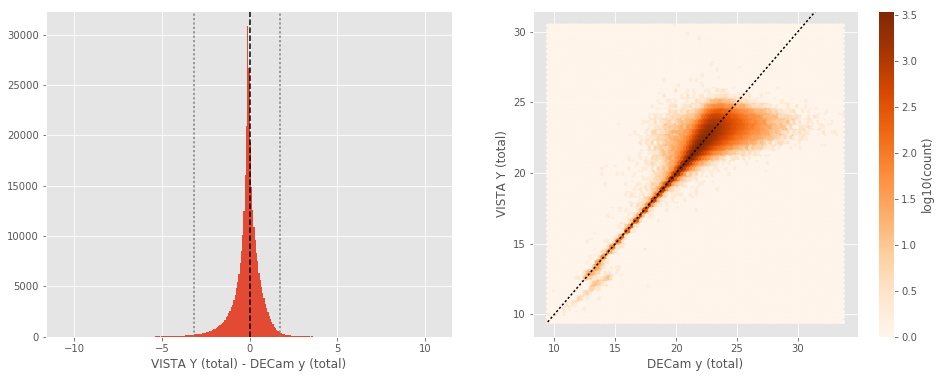

UKIDSS J (aperture) - VISTA J (aperture):
- Median: 0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9214369010925292
- 99% percentile: 1.0695792579650878


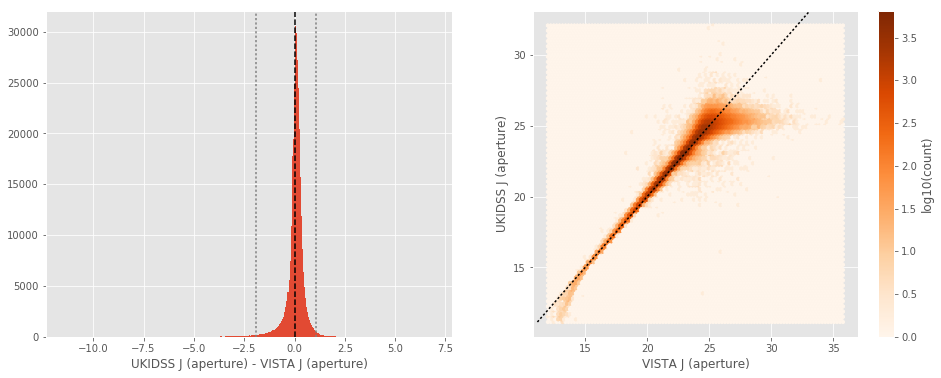

UKIDSS J (total) - VISTA J (total):
- Median: -0.04
- Median Absolute Deviation: 0.20
- 1% percentile: -1.9990338897705078
- 99% percentile: 1.1237585067749023


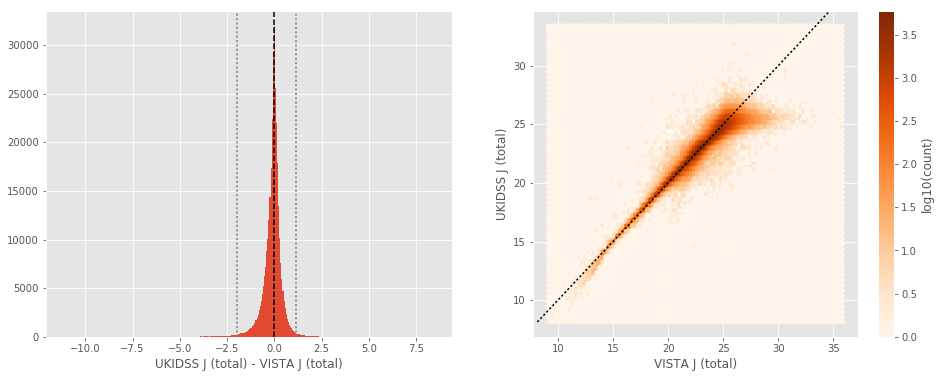

WIRCAM J (aperture) - VISTA J (aperture):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1215943145751952
- 99% percentile: 2.141083145141601


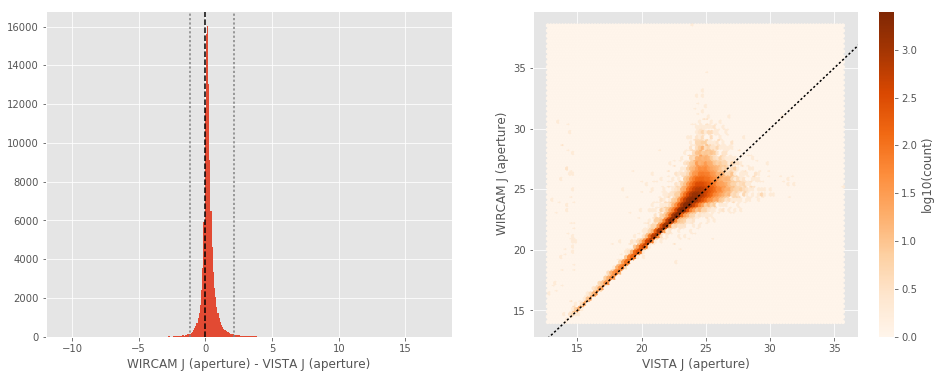

WIRCAM J (total) - VISTA J (total):
- Median: -0.00
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3996848678588867
- 99% percentile: 2.288000526428222


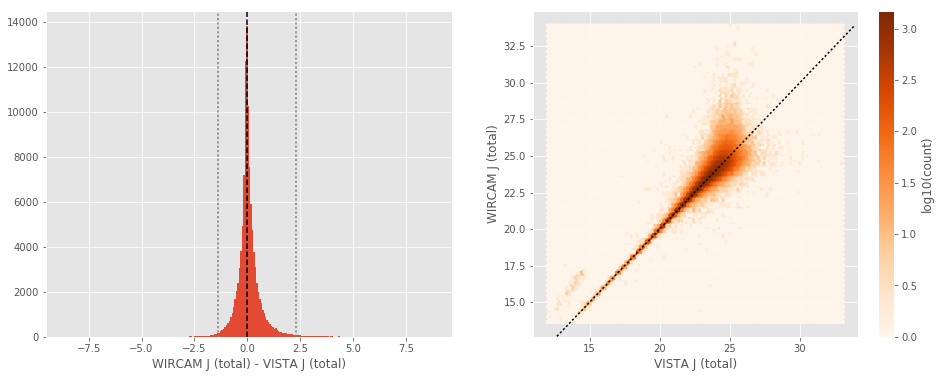

WIRCAM J (aperture) - UKIDSS J (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.32466945648193357
- 99% percentile: 1.1296821784973141


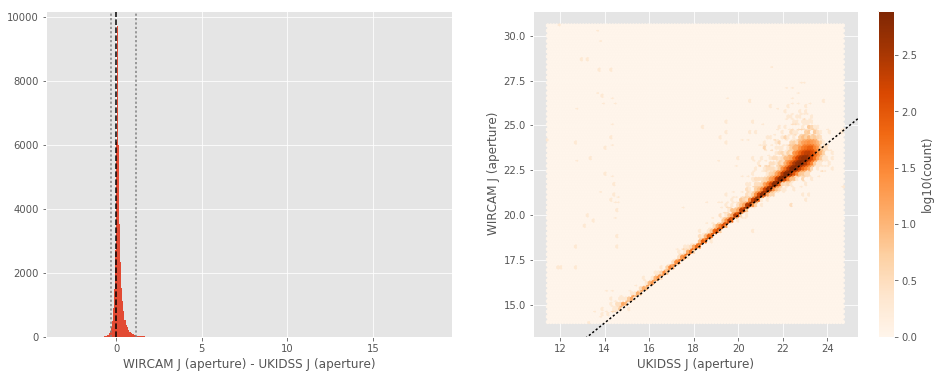

WIRCAM J (total) - UKIDSS J (total):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -0.9389879035949706
- 99% percentile: 1.6195438385009657


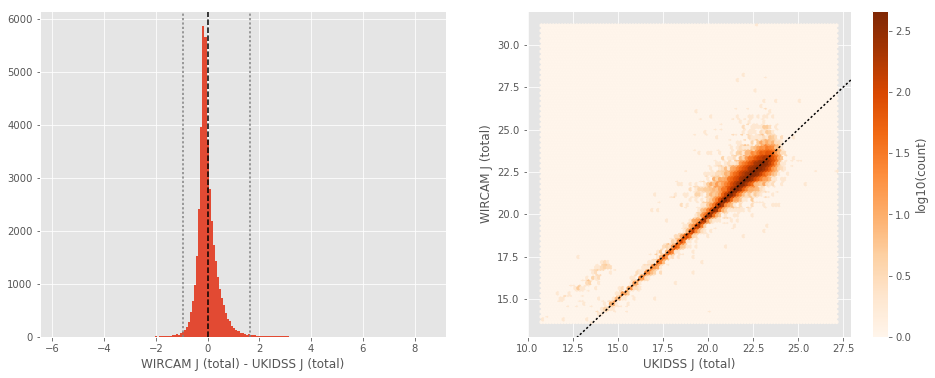

UKIDSS H (aperture) - VISTA H (aperture):
- Median: 0.15
- Median Absolute Deviation: 0.19
- 1% percentile: -2.3546463012695313
- 99% percentile: 1.4190990447998042


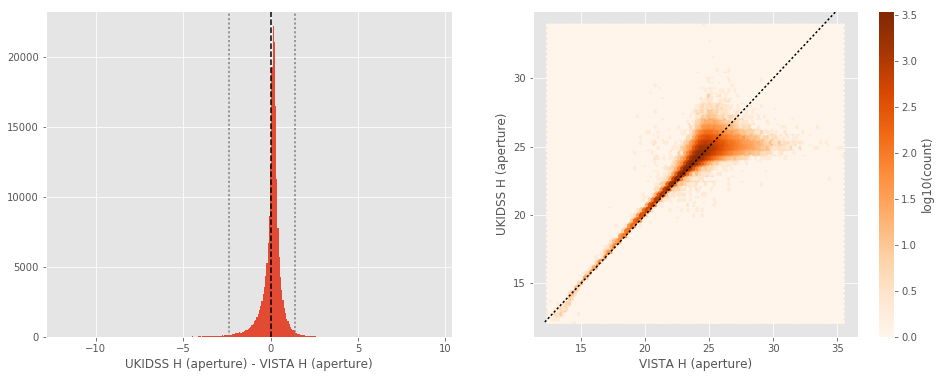

UKIDSS H (total) - VISTA H (total):
- Median: -0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -2.3657561492919923
- 99% percentile: 1.3912036705017097


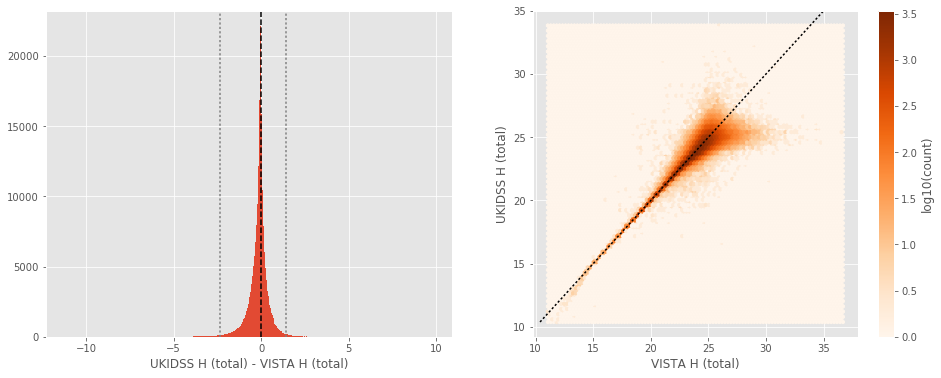

WIRCAM H (aperture) - VISTA H (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3035173034667968
- 99% percentile: 1.9530482482910159


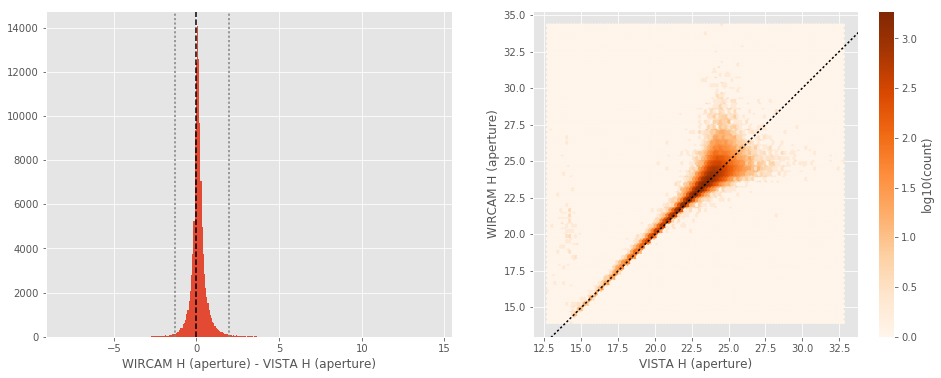

WIRCAM H (total) - VISTA H (total):
- Median: -0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.459299545288086
- 99% percentile: 2.1663842773437487


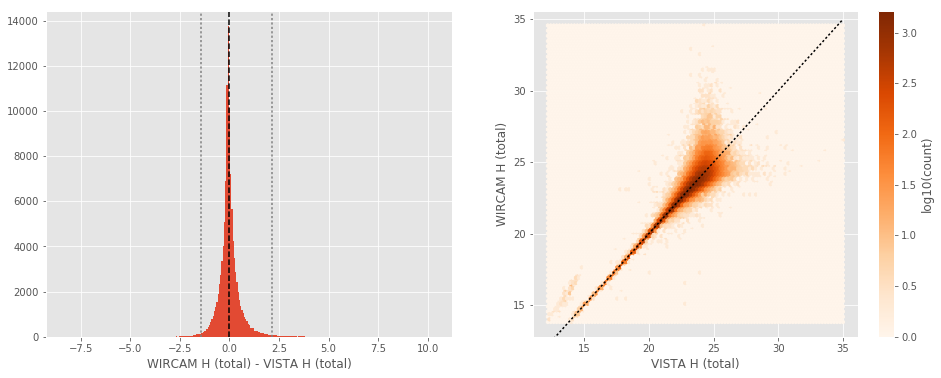

No sources have both UKIDSS H (aperture) and WIRCAM H (aperture) values.
No sources have both UKIDSS H (total) and WIRCAM H (total) values.
UKIDSS K (aperture) - VISTA Ks (aperture):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.9627726364135742
- 99% percentile: 1.1361247253417956


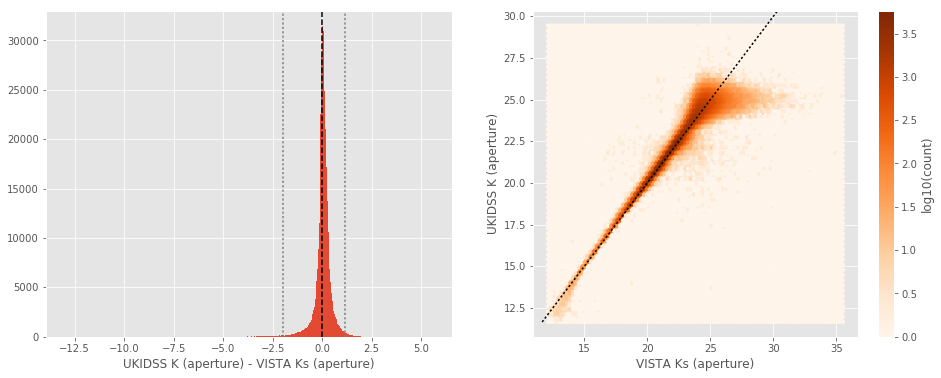

UKIDSS K (total) - VISTA Ks (total):
- Median: -0.00
- Median Absolute Deviation: 0.20
- 1% percentile: -2.1323244857788084
- 99% percentile: 1.1418404960632325


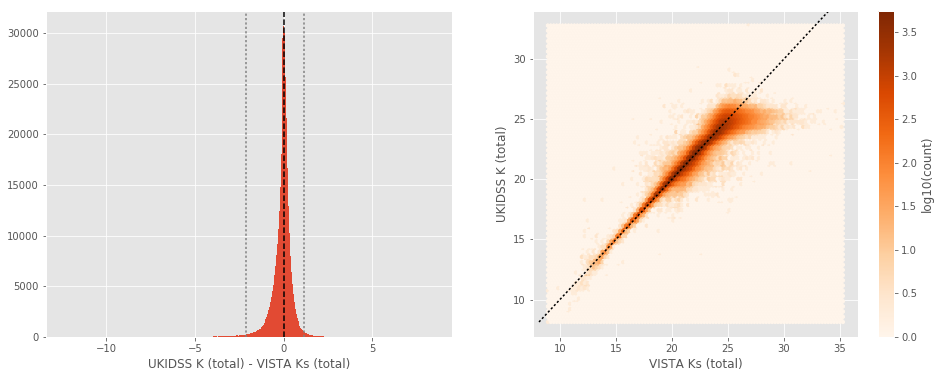

WIRCAM Ks (aperture) - VISTA Ks (aperture):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -1.7124255752563475
- 99% percentile: 1.2553991127014184


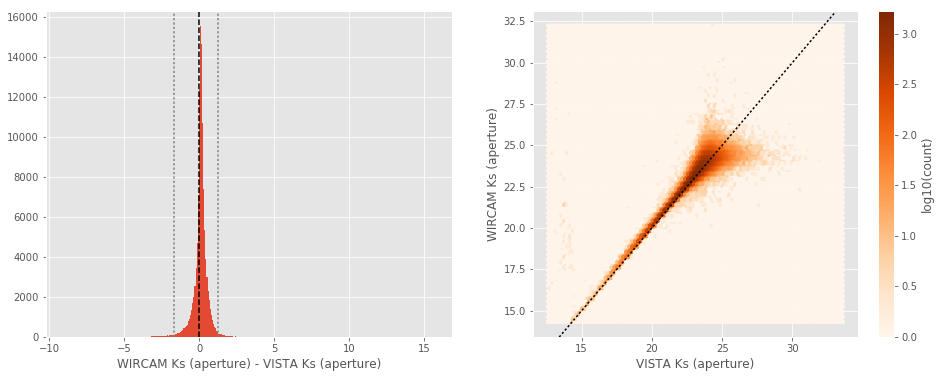

WIRCAM Ks (total) - VISTA Ks (total):
- Median: -0.07
- Median Absolute Deviation: 0.17
- 1% percentile: -1.9730116081237794
- 99% percentile: 1.2287907409667889


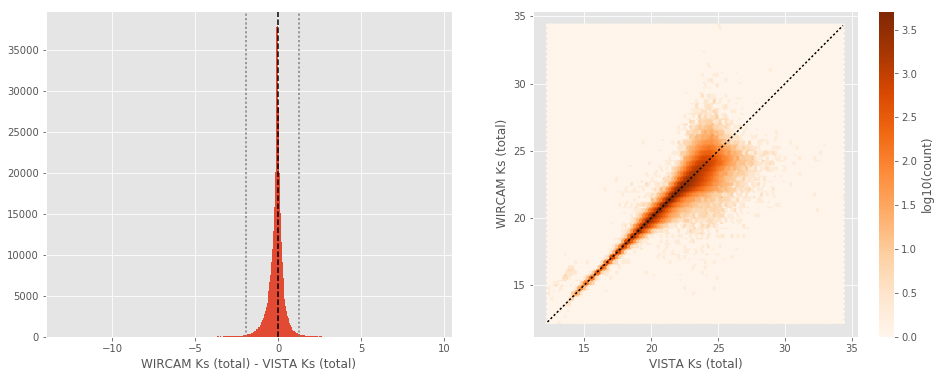

WIRCAM Ks (aperture) - UKIDSS K (aperture):
- Median: 0.09
- Median Absolute Deviation: 0.08
- 1% percentile: -0.4083726501464844
- 99% percentile: 0.9650620651245115


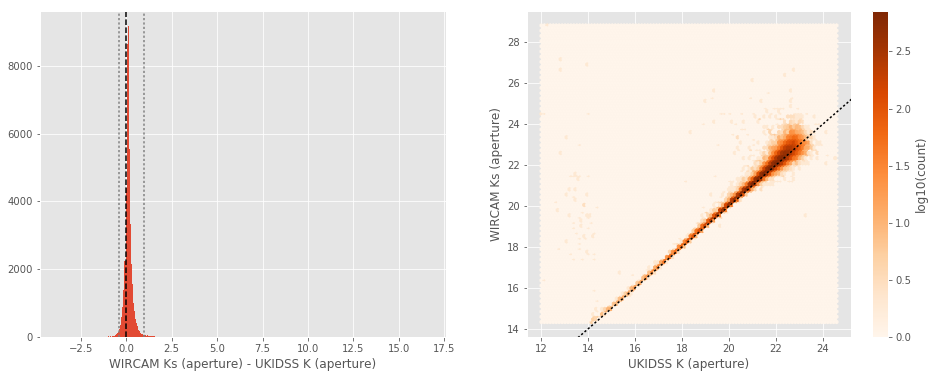

WIRCAM Ks (total) - UKIDSS K (total):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3401247215270997
- 99% percentile: 1.35105318069458


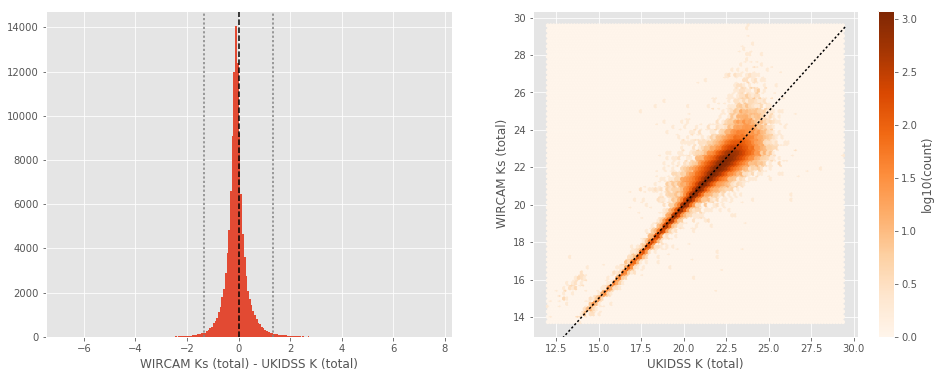

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_XMM-LSS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.57
- 1% percentile: -2.2751345825195313
- 99% percentile: 3.3653318023681678


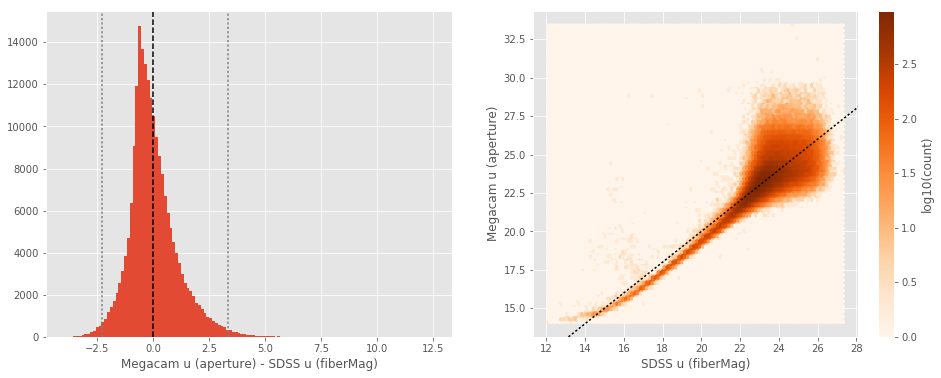

Megacam u (total) - SDSS u (petroMag):
- Median: 0.03
- Median Absolute Deviation: 0.93
- 1% percentile: -4.6937056732177735
- 99% percentile: 4.555379714965818


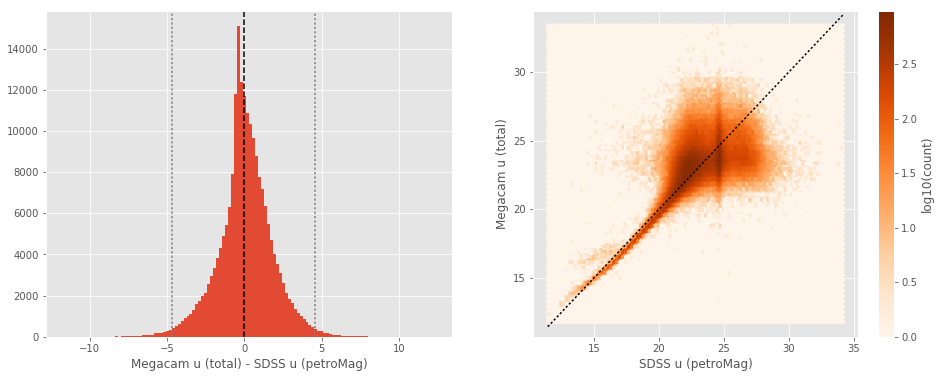

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.34
- Median Absolute Deviation: 0.13
- 1% percentile: -1.123851852416992
- 99% percentile: 0.9108949470520021


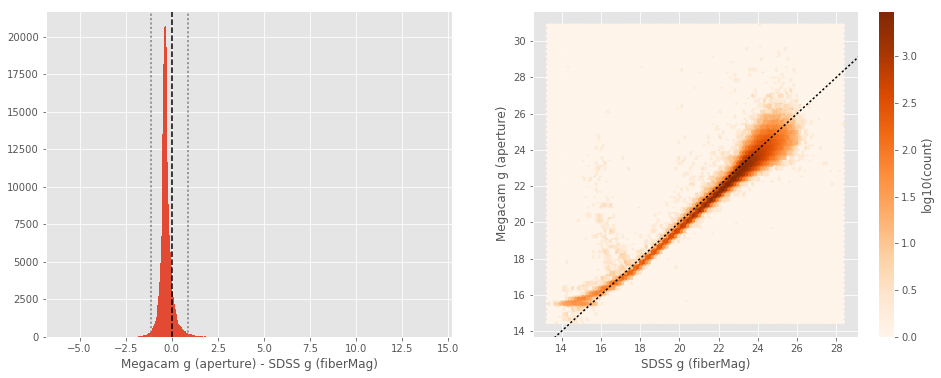

Megacam g (total) - SDSS g (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.22
- 1% percentile: -3.1877701759338377
- 99% percentile: 1.6303510665893541


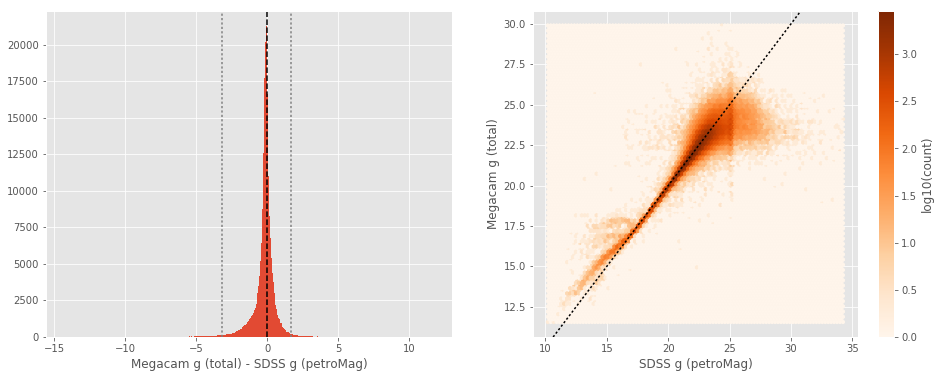

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1416707611083985
- 99% percentile: 1.4423069000244118


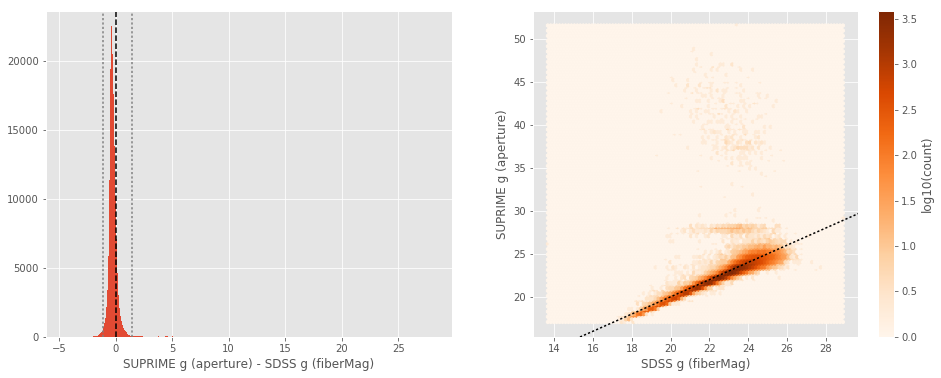

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.12
- Median Absolute Deviation: 0.23
- 1% percentile: -3.2095663833618167
- 99% percentile: 2.1891762351989774


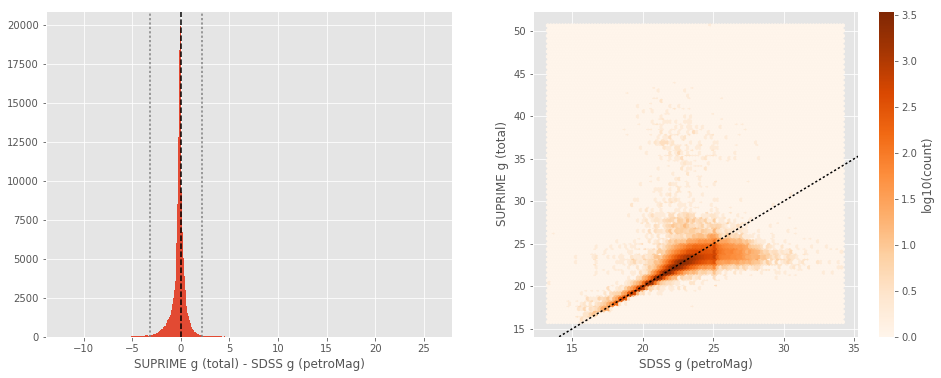

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.56
- Median Absolute Deviation: 0.26
- 1% percentile: -2.621867046356201
- 99% percentile: 1.6956675338745133


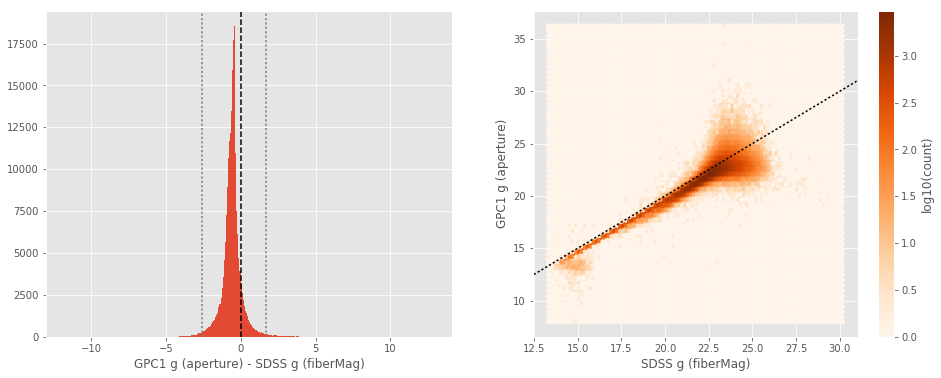

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.25
- 1% percentile: -3.995189514160156
- 99% percentile: 1.6608182525634765


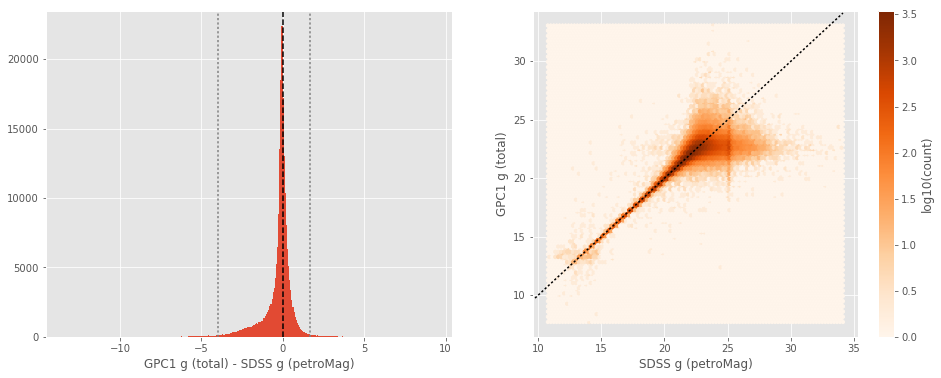

DECam g (aperture) - SDSS g (fiberMag):
- Median: -1.08
- Median Absolute Deviation: 0.18
- 1% percentile: -1.9127683448791504
- 99% percentile: 0.5145744132995476


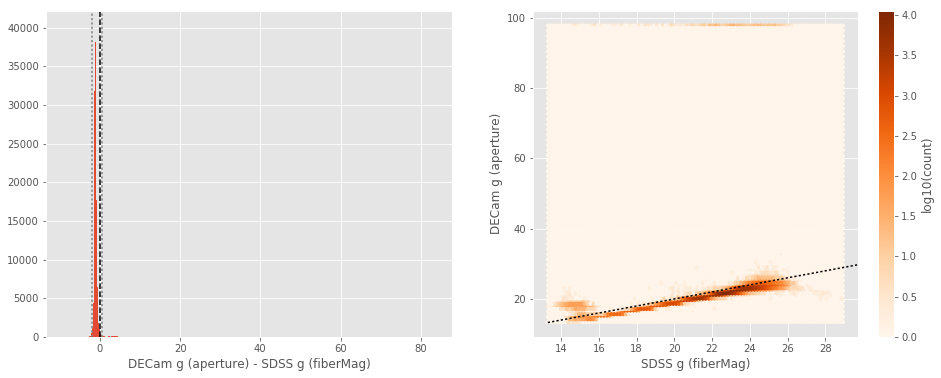

DECam g (total) - SDSS g (petroMag):
- Median: -0.09
- Median Absolute Deviation: 0.21
- 1% percentile: -3.2186181068420407
- 99% percentile: 2.0392830467224115


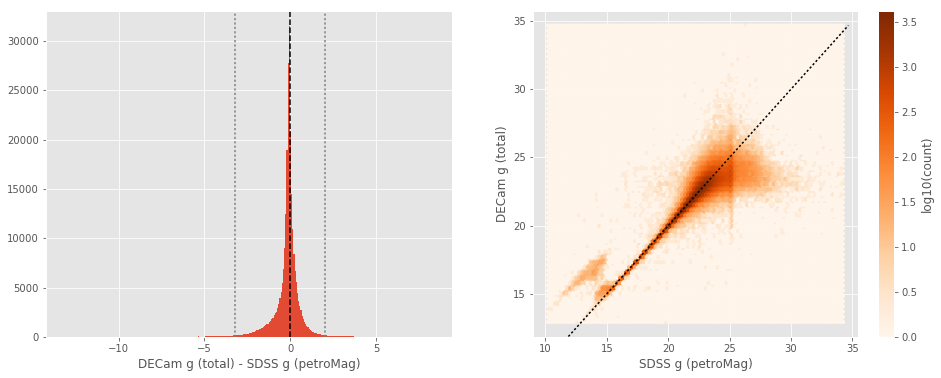

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.09
- 1% percentile: -0.9251340866088869
- 99% percentile: 0.5400774002075182


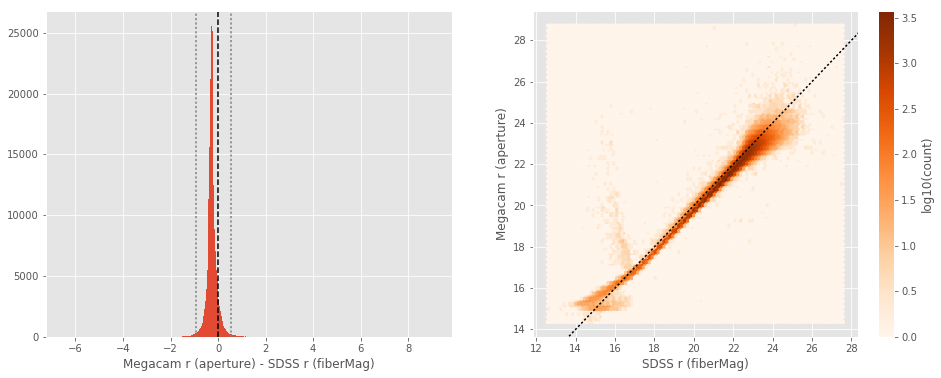

Megacam r (total) - SDSS r (petroMag):
- Median: -0.02
- Median Absolute Deviation: 0.15
- 1% percentile: -2.66434398651123
- 99% percentile: 1.3247677230834891


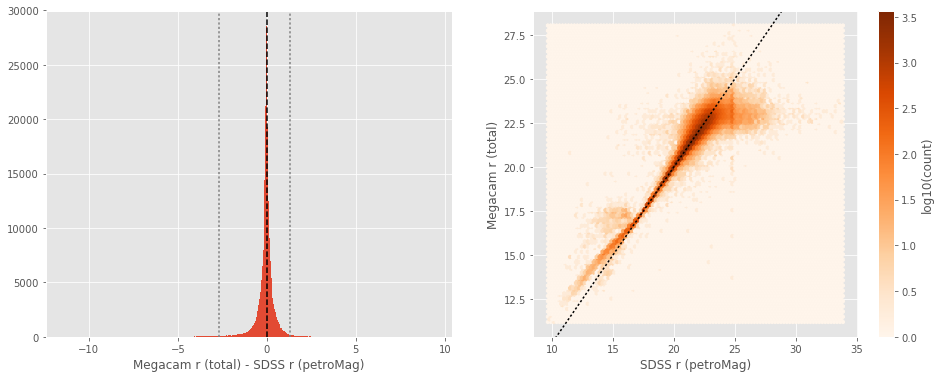

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9902078628540039
- 99% percentile: 1.1710420608520393


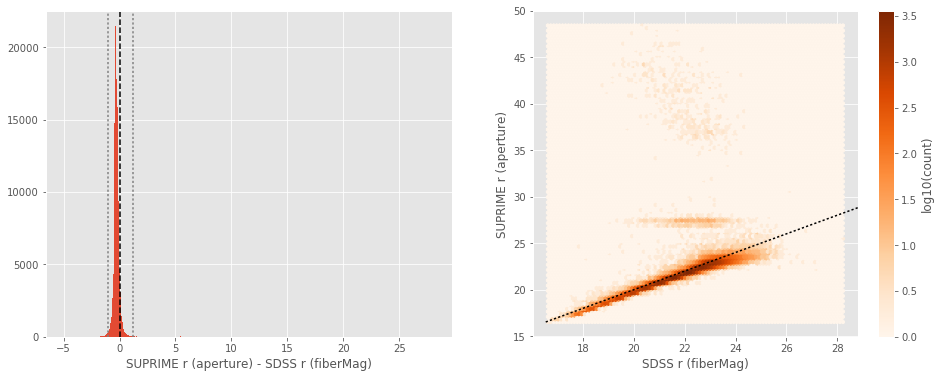

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -2.766994857788086
- 99% percentile: 2.016816101074216


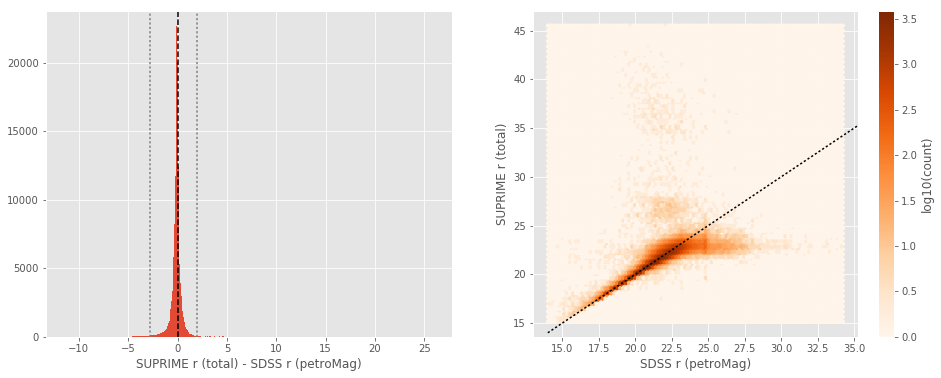

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.43
- Median Absolute Deviation: 0.17
- 1% percentile: -1.6574337005615236
- 99% percentile: 0.9487424850463924


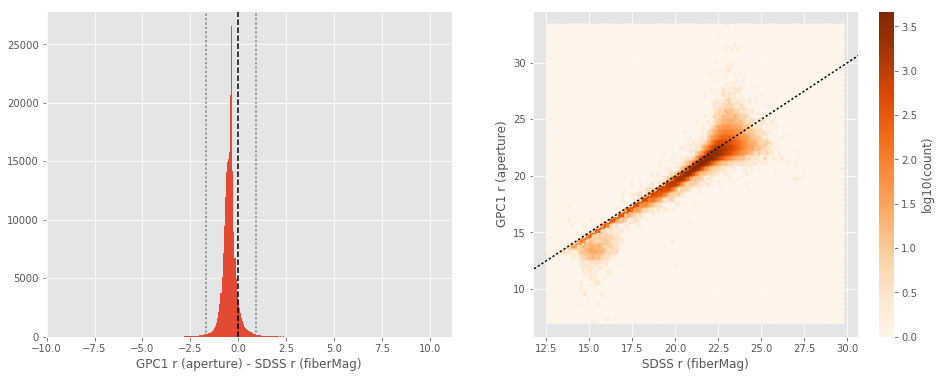

GPC1 r (total) - SDSS r (petroMag):
- Median: 0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -2.530831642150879
- 99% percentile: 1.2362984848022474


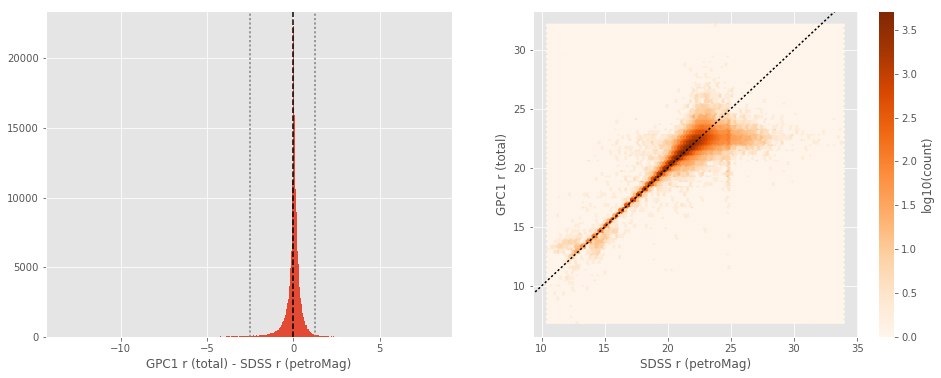

DECam r (aperture) - SDSS r (fiberMag):
- Median: -1.05
- Median Absolute Deviation: 0.15
- 1% percentile: -1.8101396942138672
- 99% percentile: 2.647759933471689


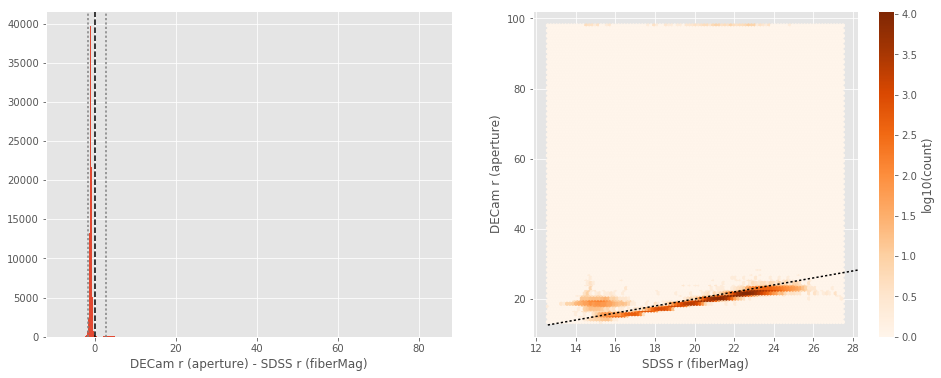

DECam r (total) - SDSS r (petroMag):
- Median: -0.13
- Median Absolute Deviation: 0.15
- 1% percentile: -2.9224452590942382
- 99% percentile: 2.6911641693115254


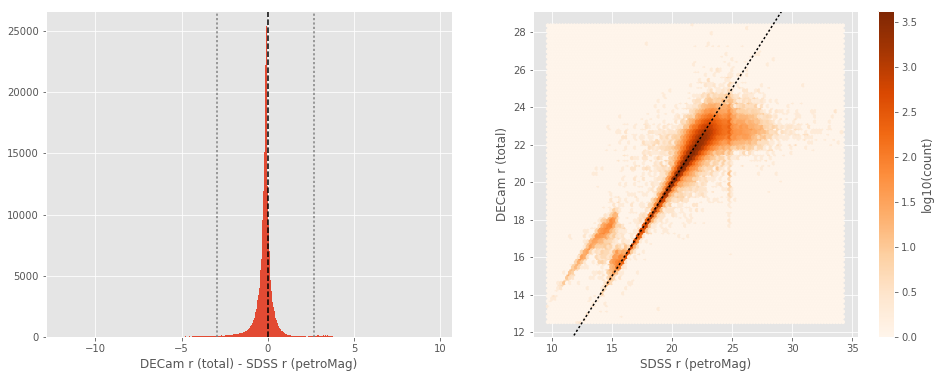

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.09
- 1% percentile: -0.9270356559753419
- 99% percentile: 0.5739220142364483


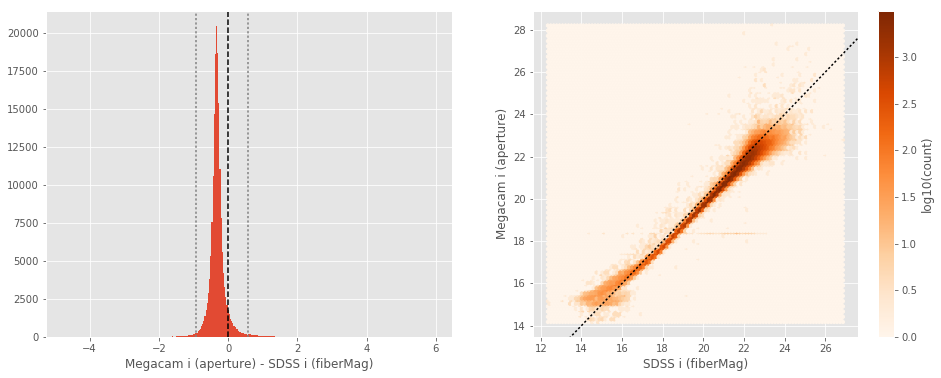

Megacam i (total) - SDSS i (petroMag):
- Median: -0.05
- Median Absolute Deviation: 0.15
- 1% percentile: -3.24697473526001
- 99% percentile: 1.1342191123962417


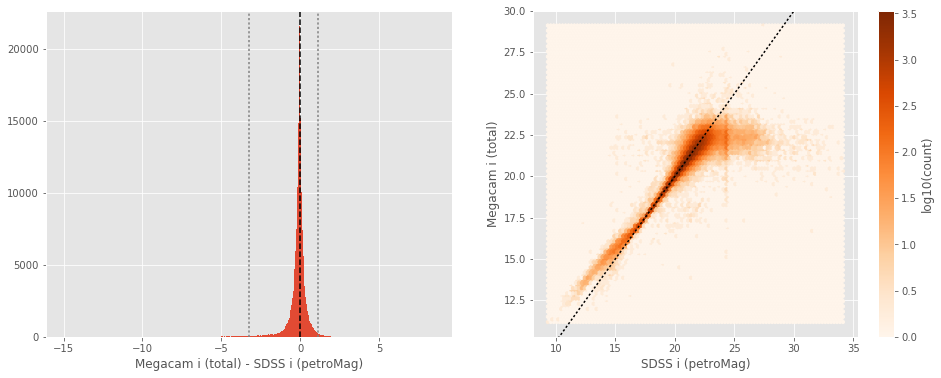

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9437793731689452
- 99% percentile: 4.508206176757836


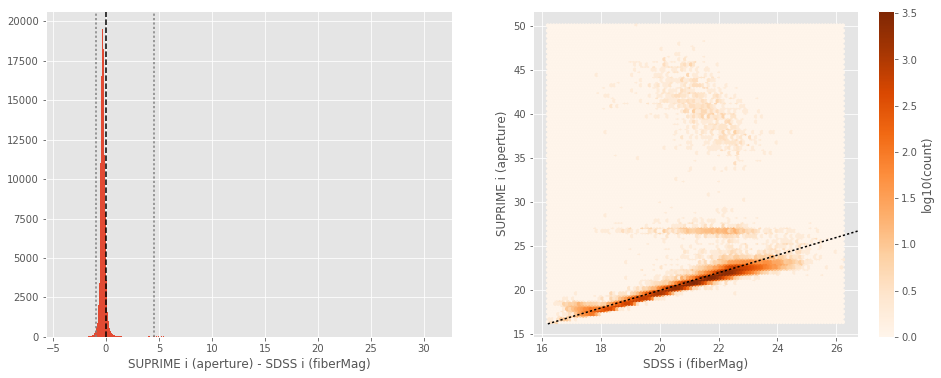

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.13
- Median Absolute Deviation: 0.17
- 1% percentile: -3.38938720703125
- 99% percentile: 4.590608062744156


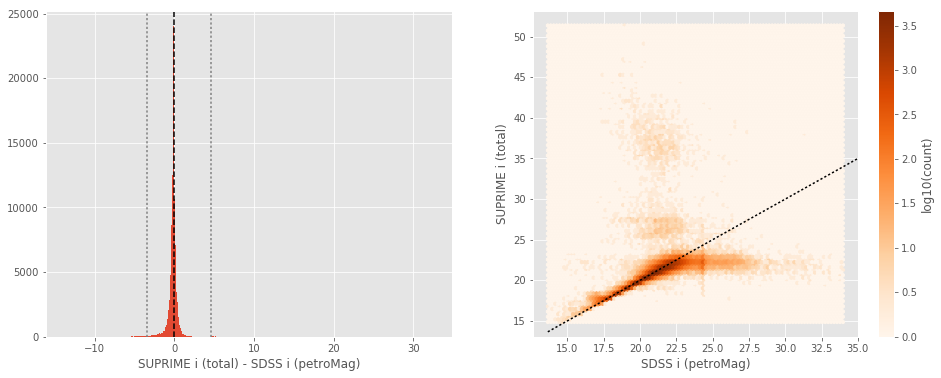

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.41
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1639830780029294
- 99% percentile: 0.2622521018981934


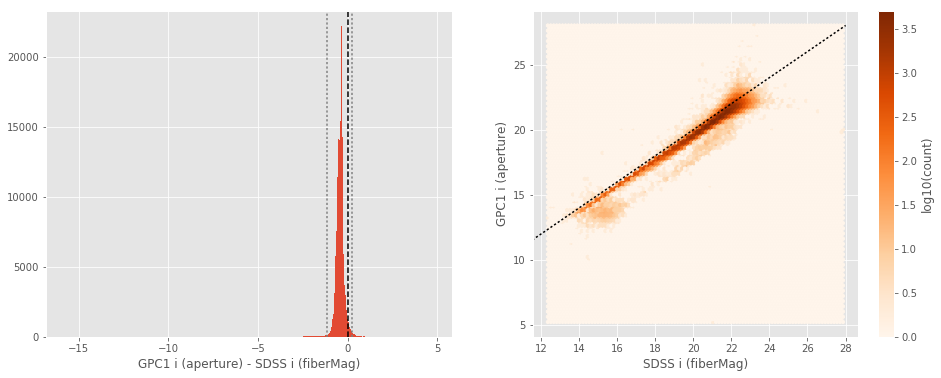

GPC1 i (total) - SDSS i (petroMag):
- Median: 0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -2.3953161239624023
- 99% percentile: 0.9681820869445801


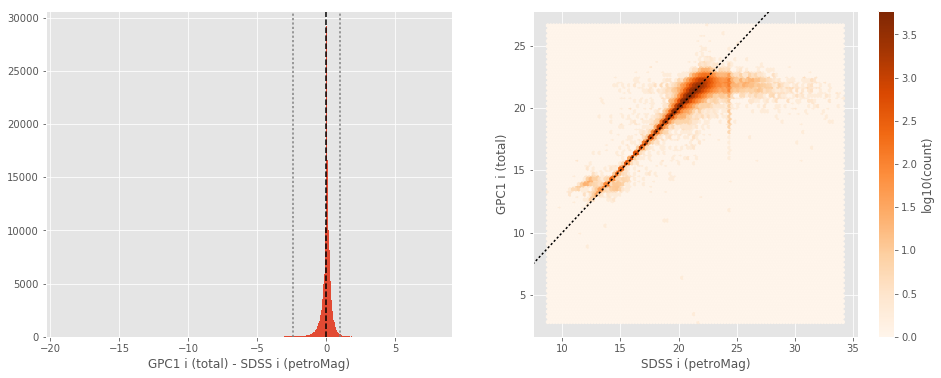

DECam i (aperture) - SDSS i (fiberMag):
- Median: -0.94
- Median Absolute Deviation: 0.15
- 1% percentile: -1.587510757446289
- 99% percentile: 3.938628807067869


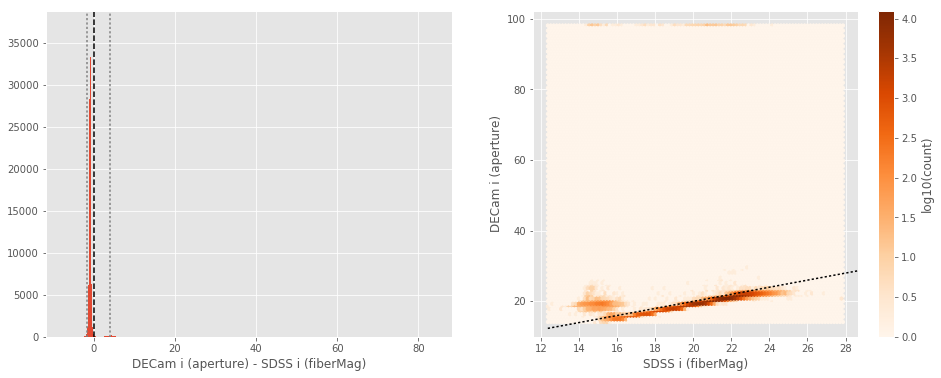

DECam i (total) - SDSS i (petroMag):
- Median: -0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -3.402414703369141
- 99% percentile: 3.0521274948120105


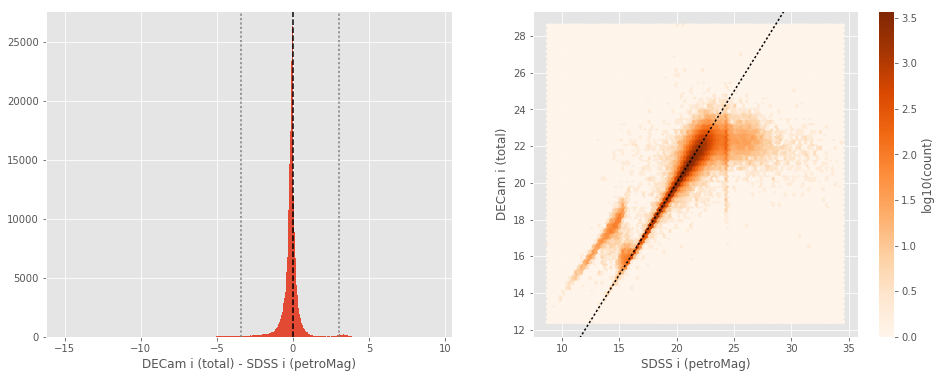

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.17
- Median Absolute Deviation: 0.15
- 1% percentile: -1.177499771118164
- 99% percentile: 1.118804931640625


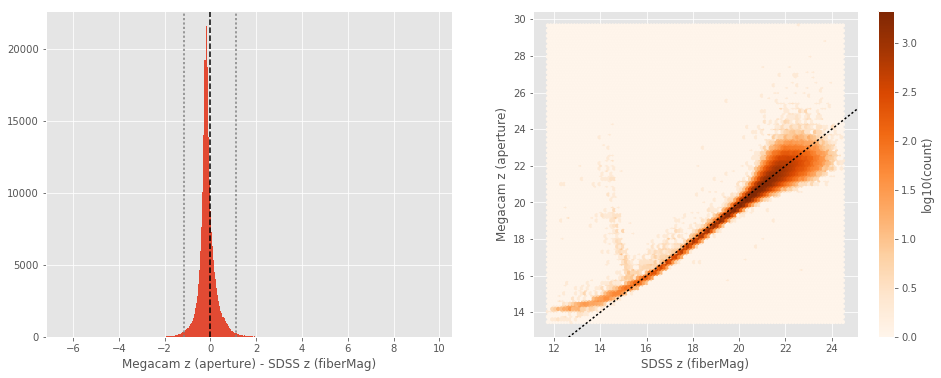

Megacam z (total) - SDSS z (petroMag):
- Median: 0.05
- Median Absolute Deviation: 0.31
- 1% percentile: -3.574898223876953
- 99% percentile: 1.9354556274414088


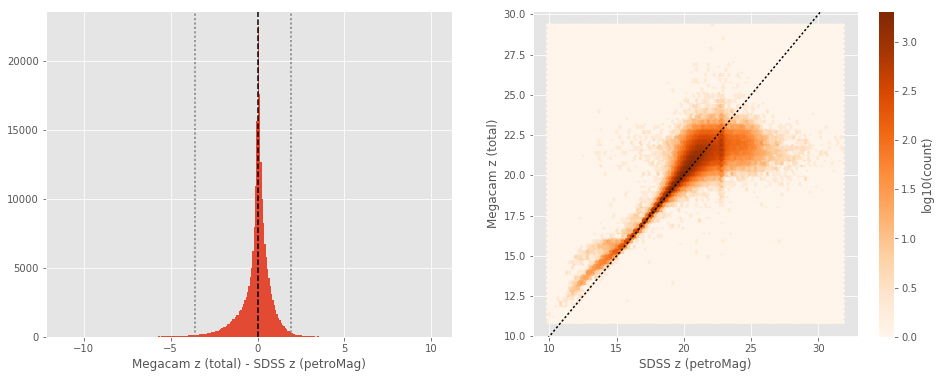

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.21
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2239856719970703
- 99% percentile: 1.9564708709716985


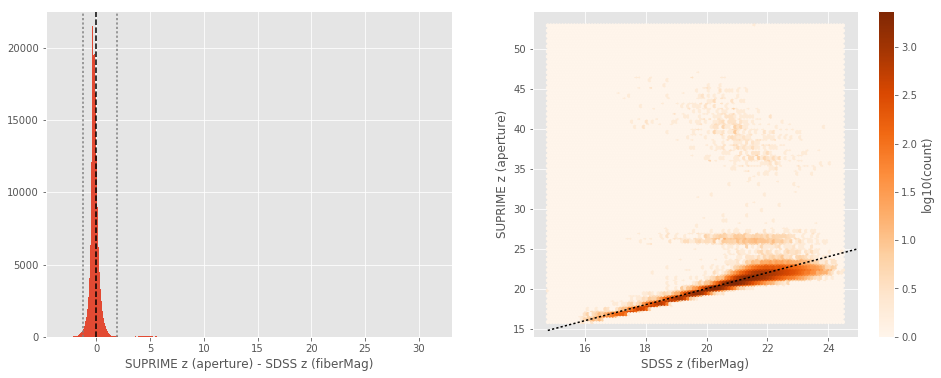

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.02
- Median Absolute Deviation: 0.32
- 1% percentile: -3.658335437774658
- 99% percentile: 2.711967620849617


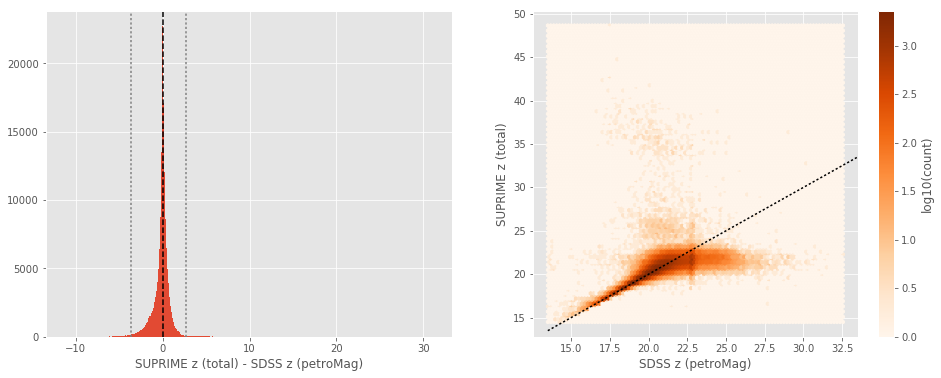

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.31
- Median Absolute Deviation: 0.16
- 1% percentile: -1.509418601989746
- 99% percentile: 0.823353004455559


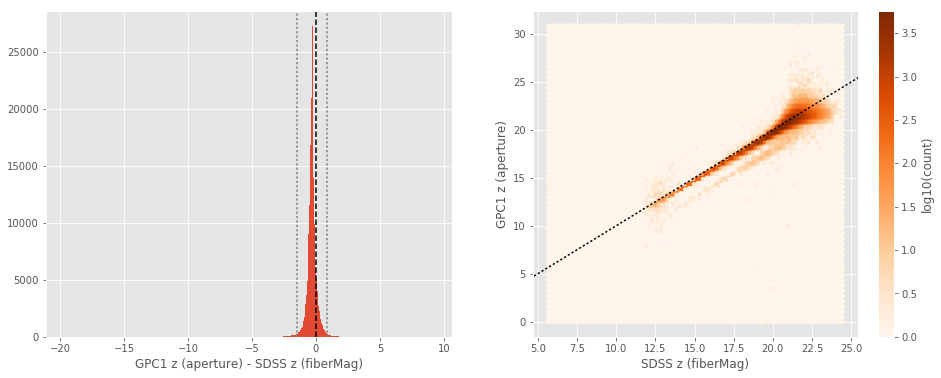

GPC1 z (total) - SDSS z (petroMag):
- Median: 0.12
- Median Absolute Deviation: 0.26
- 1% percentile: -3.4634803771972655
- 99% percentile: 1.6262458229065015


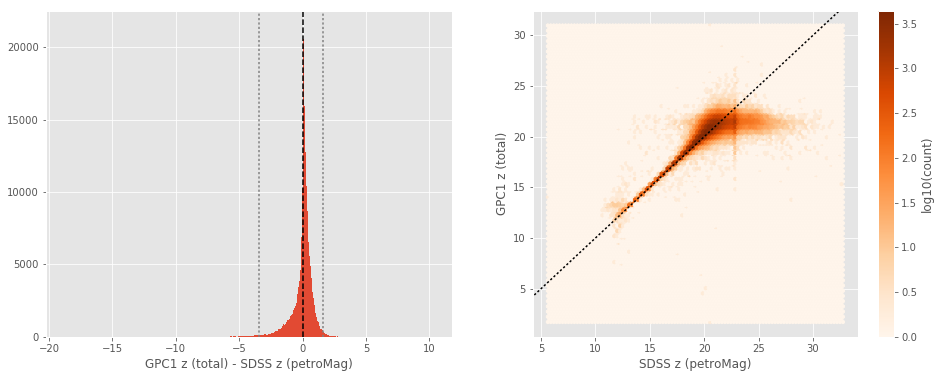

DECam z (aperture) - SDSS z (fiberMag):
- Median: -0.78
- Median Absolute Deviation: 0.20
- 1% percentile: -1.8156087493896482
- 99% percentile: 4.274272079467762


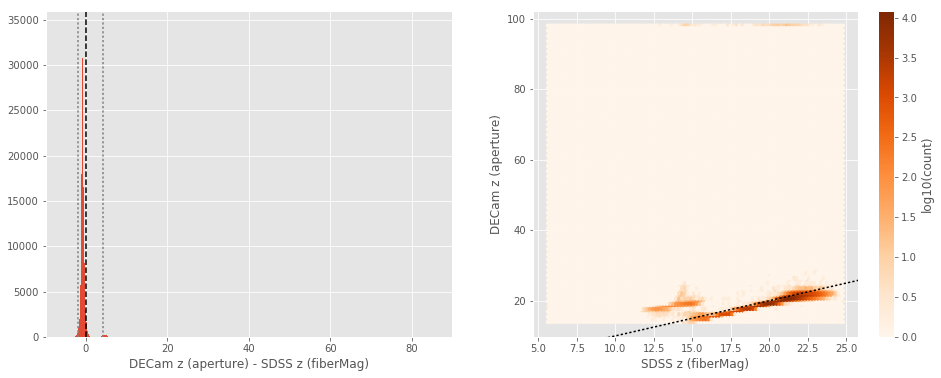

DECam z (total) - SDSS z (petroMag):
- Median: -0.03
- Median Absolute Deviation: 0.32
- 1% percentile: -3.7203544616699222
- 99% percentile: 2.8801563262939505


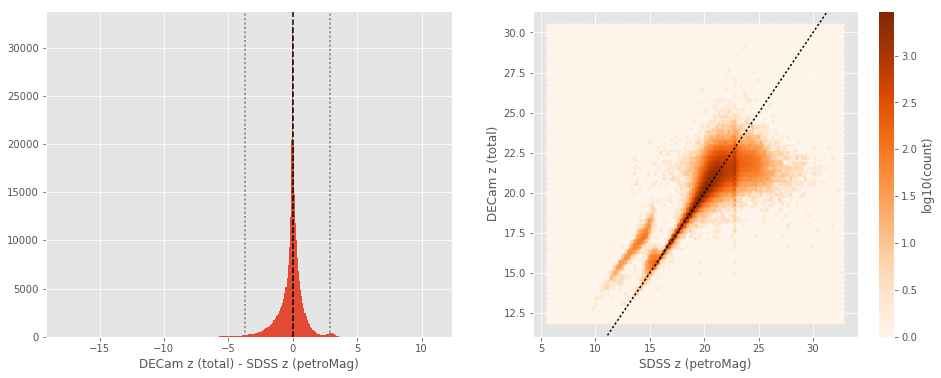

VISTA Z (aperture) - SDSS Z (fiberMag):
- Median: -0.18
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1833756065368652
- 99% percentile: 7.6132506561279225


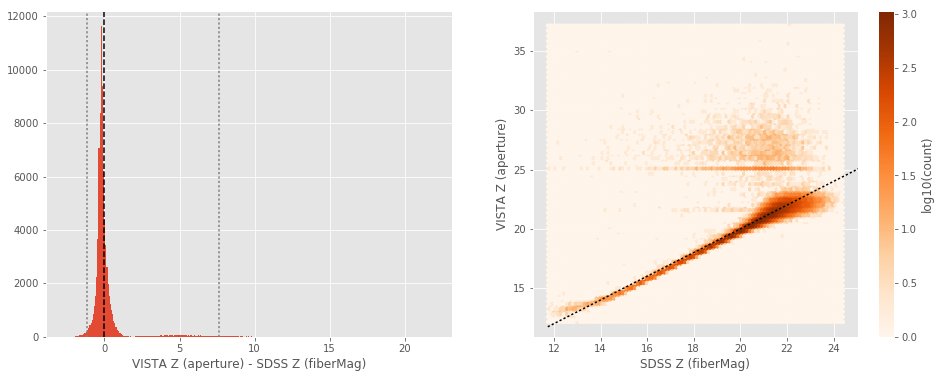

VISTA Z (total) - SDSS Z (petroMag):
- Median: 0.01
- Median Absolute Deviation: 0.34
- 1% percentile: -3.6964190101623533
- 99% percentile: 7.246449146270747


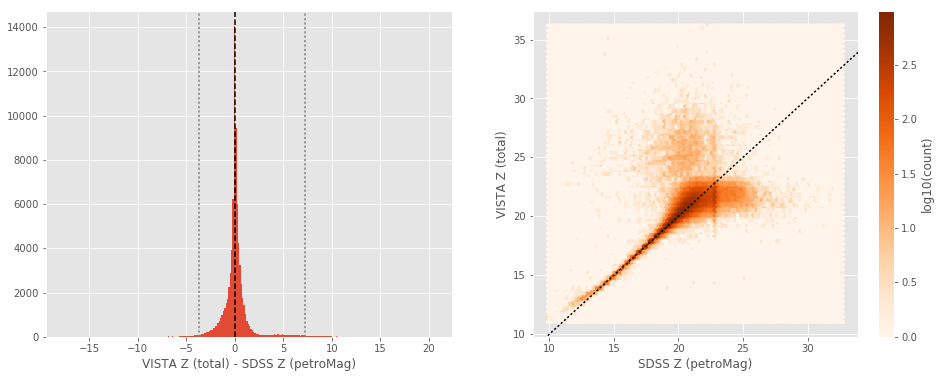

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1].lower())]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1].lower())]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_XMM-LSS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.02
- Median Absolute Deviation: 0.07
- 1% percentile: -1.0932426983548953
- 99% percentile: 0.5413428393648322


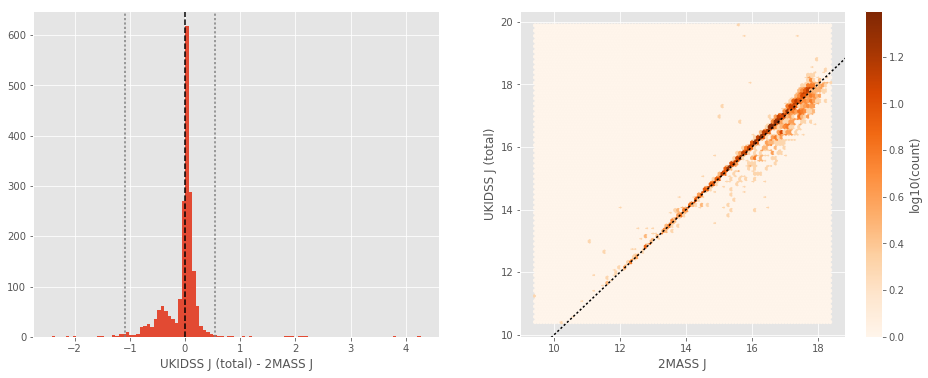

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.07
- Median Absolute Deviation: 0.11
- 1% percentile: -1.0089280363329456
- 99% percentile: 1.0822714661542399


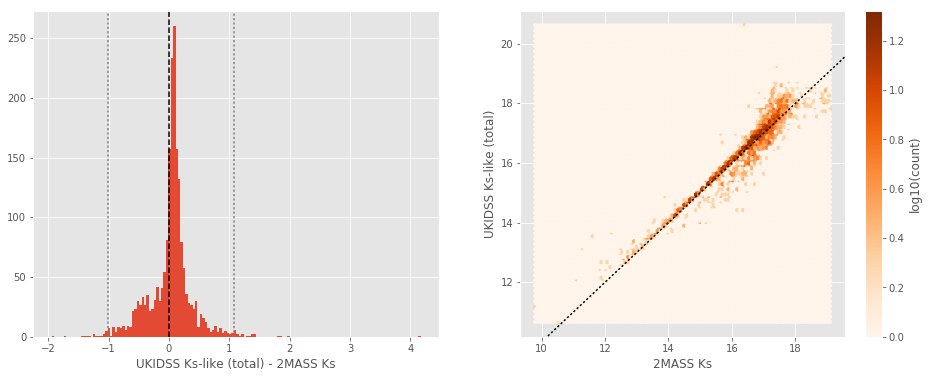

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

WIRCAM J (total) - 2MASS J:
- Median: -0.00
- Median Absolute Deviation: 0.10
- 1% percentile: -1.4933099580289682
- 99% percentile: 3.0649023654268435


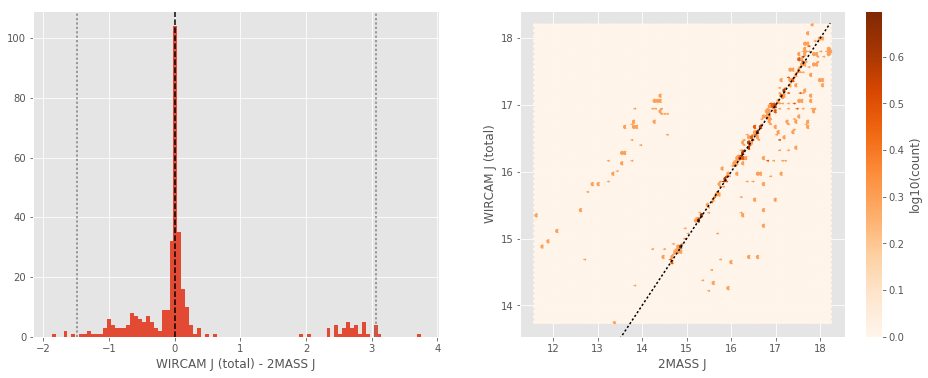

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wircam_j'][ml_twomass_idx],
                labels=("2MASS J", "WIRCAM J (total)"))

WIRCAM Ks (total) - 2MASS Ks:
- Median: -0.03
- Median Absolute Deviation: 0.13
- 1% percentile: -1.3042394484575779
- 99% percentile: 1.0053603971234775


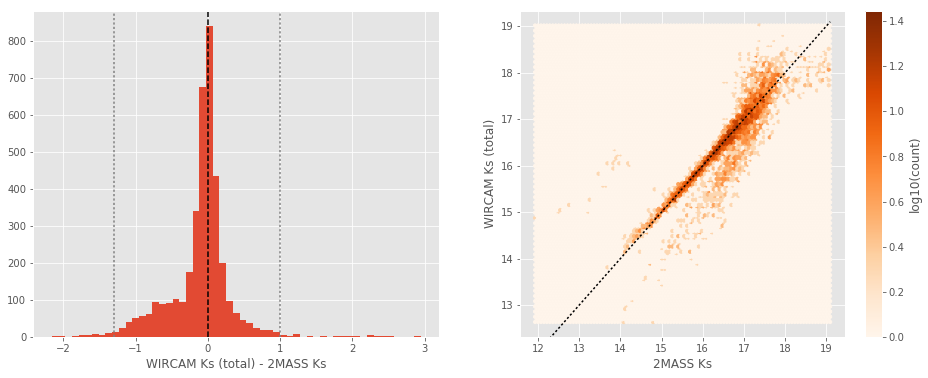

In [19]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wircam_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "WIRCAM Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 4150670 / 8697783 (47.72%)


/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in subtract


Number of source used: 4718862 / 8697783 (54.25%)
Number of source used: 373246 / 8697783 (4.29%)
Number of source used: 1912624 / 8697783 (21.99%)


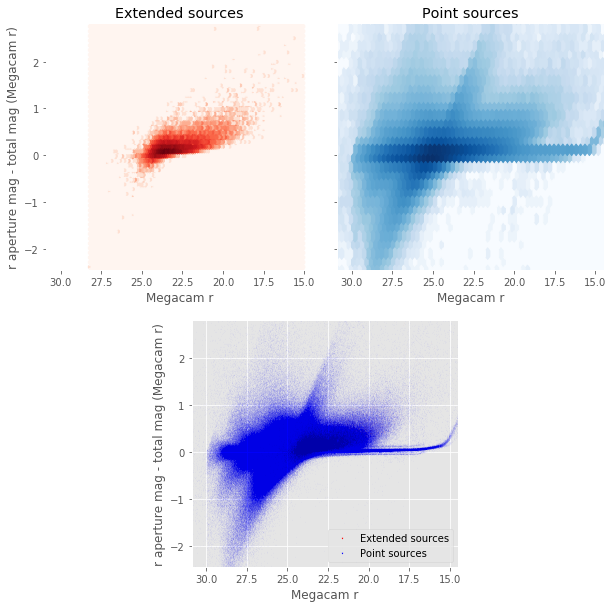

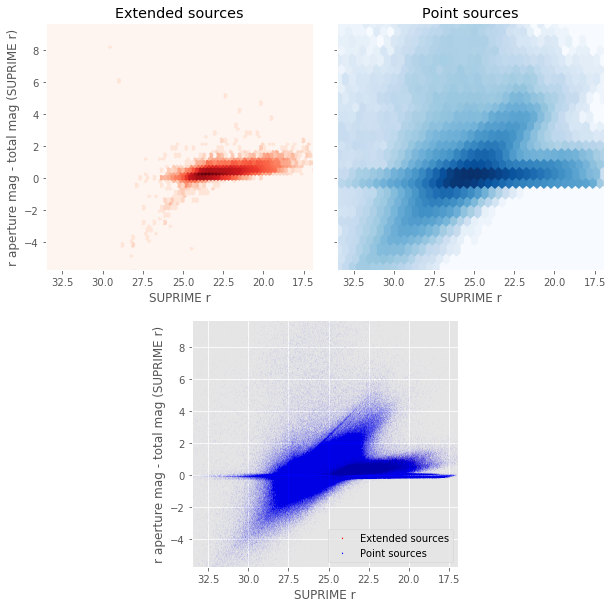

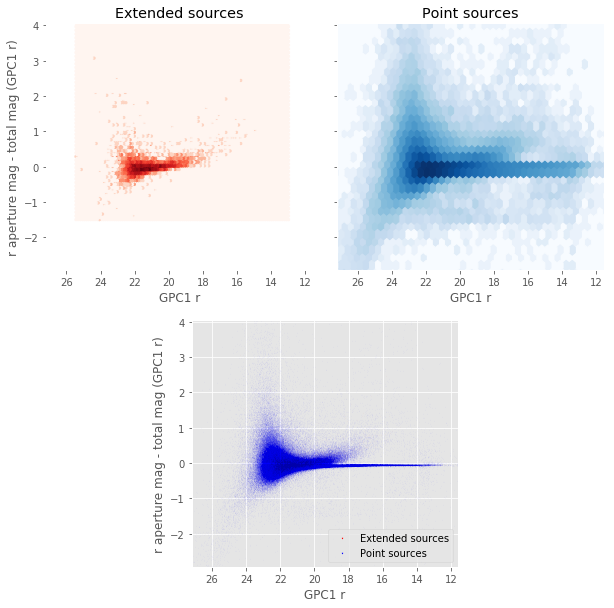

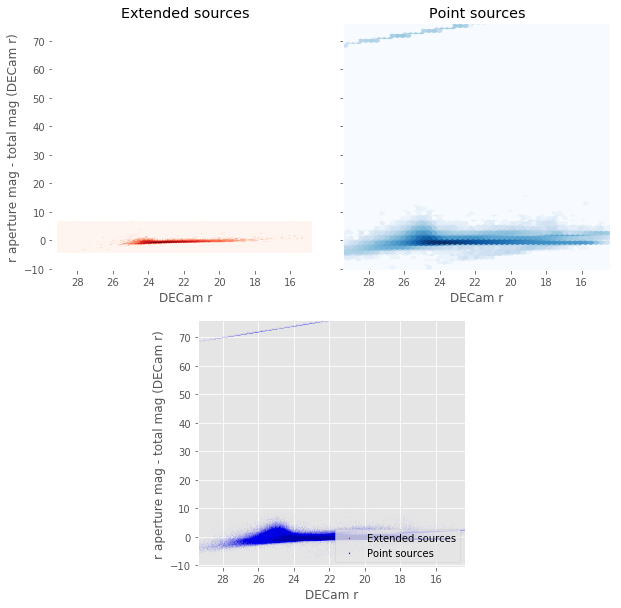

In [20]:
for band in r_bands:
    nb_ccplots(
        master_catalogue["m_{}".format(band.replace(" ", "_").lower())],
        master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())] - master_catalogue["m_{}".format(band.replace(" ", "_").lower())],
        band, "r aperture mag - total mag ({})".format(band),
        master_catalogue["stellarity"],
        invert_x=True
    )

## V - Color-color and magnitude-color plots

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 401770 / 8697783 (4.62%)


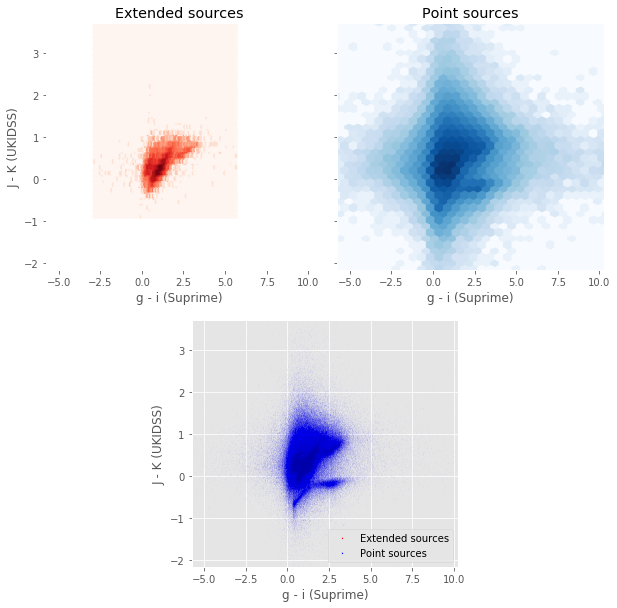

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (Suprime)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in subtract
  app.launch_new_instance()


Number of source used: 726736 / 8697783 (8.36%)


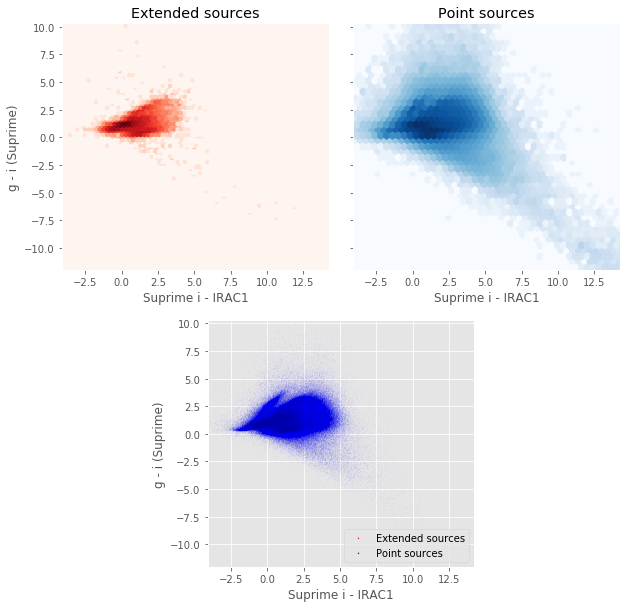

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_irac_i1'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    "Suprime i - IRAC1", "g - i (Suprime)",
    master_catalogue["stellarity"]
)

Number of source used: 3640711 / 8697783 (41.86%)


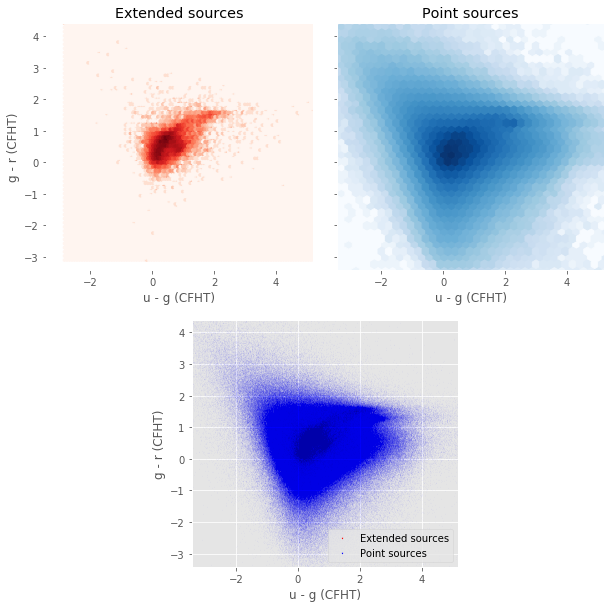

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 405085 / 8697783 (4.66%)


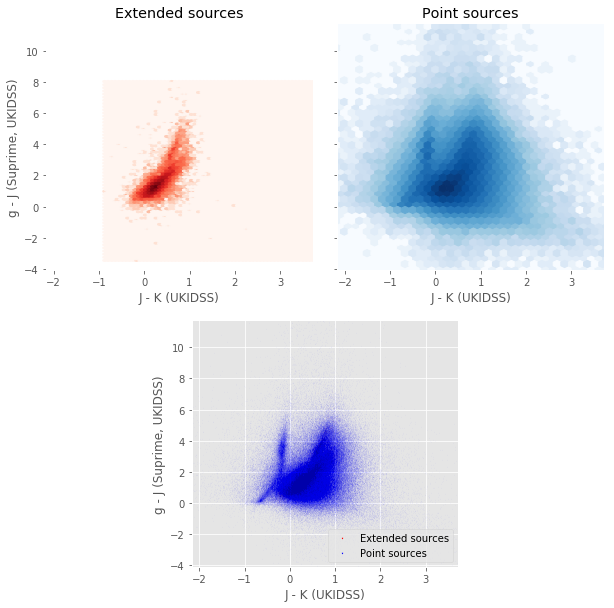

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (Suprime, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 427689 / 8697783 (4.92%)


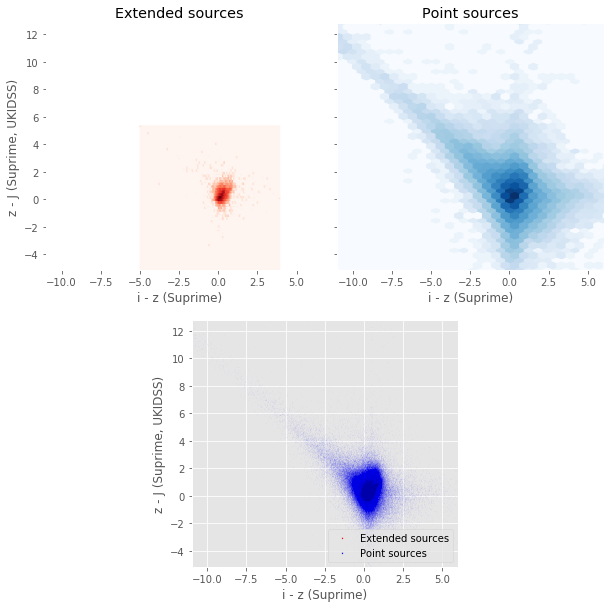

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (Suprime)", "z - J (Suprime, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in subtract
  app.launch_new_instance()


Number of source used: 35564 / 8697783 (0.41%)


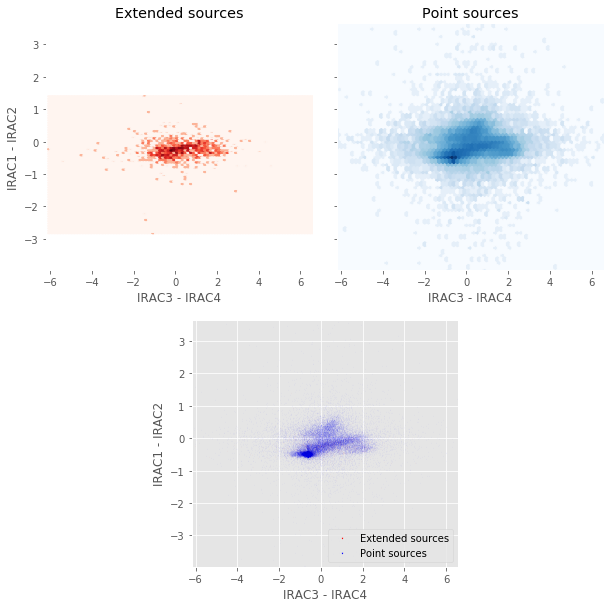

In [26]:
nb_ccplots(
    master_catalogue['m_irac_i3'] - master_catalogue['m_irac_i4'],
    master_catalogue['m_irac_i1'] - master_catalogue['m_irac_i2'],
    "IRAC3 - IRAC4", "IRAC1 - IRAC2",
    master_catalogue["stellarity"]
)